In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import contextily as cx
import os
import rasterio
from scipy.stats import spearmanr, pearsonr
from rasterio.transform import from_bounds
import time
import pickle
from rasterio.mask import mask, raster_geometry_mask
from shapely.geometry import MultiPolygon, mapping, Point
import Levenshtein
from scipy.optimize import linear_sum_assignment
import seaborn as sns
from matplotlib.colors import to_rgba

import matplotlib.patches as mpatches 

from matplotlib.colors import LinearSegmentedColormap
import matplotlib.ticker as mticker
import matplotlib.colors as colors
from matplotlib.colors import BoundaryNorm

from scipy.spatial import Voronoi, voronoi_plot_2d


import osmnx as ox
from matplotlib.lines import Line2D
from sklearn import linear_model
import requests
from time import sleep
from rasterio.enums import Resampling
import csv
from scipy import ndimage as nd
from typing import Union    
from scipy.stats import mode, bootstrap, norm

In [5]:
def weighted_median(values, weights):
    i = np.argsort(values)[::-1]
    c = np.nancumsum(weights[i])
    if np.isinf(c[-1]):
        print(0.5 * c[-1])
        raise
    return values[i[np.searchsorted(c, 0.5 * c[-1])]]

def build_class_rurub_arr(rururb_arr):
    class_rur_urb_arr = np.copy(rururb_arr)

    class_rur_urb_arr[(rururb_arr>=1) & (rururb_arr<=7)] = 1
    class_rur_urb_arr[(rururb_arr>=8) & (rururb_arr<15)] = 2
    class_rur_urb_arr[(rururb_arr>=15) & (rururb_arr<22)] = 3
    class_rur_urb_arr[rururb_arr>=22] = 4
    return(class_rur_urb_arr)


# %matplotlib widget
# %matplotlib notebook
    
# Function to normalize data between 0 and 1
def normalize(data):
    return (data - np.nanmin(data)) / (np.nanmax(data) - np.nanmin(data))
#sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
# Define the black-to-red colormap
# cmap_1 = LinearSegmentedColormap.from_list("cmap_1", ["#436b42", "#e89612"])
cmap_1 = LinearSegmentedColormap.from_list("cmap_1", ["white", "blue"])

# Define the green-to-white colormap
# cmap_2 = LinearSegmentedColormap.from_list("cmap_2", ["#1287e8", "black"])
cmap_2 = LinearSegmentedColormap.from_list("cmap_2", ["red", "white"])


def create_bivariate_colormap(Z1, Z2, max_z1, max_z2, cmap1 = cmap_1 , cmap2 = cmap_2 , preset = False):

    if preset:
        z1mn = 0.
        z2mn = 0.
        z1mx = 1.
        z2mx = 1.
    else:
        z1mn = 0
        z2mn = 0
        z1mx = max_z1
        z2mx = max_z2     

    # Rescale values to fit into colormap range (0->255)
    # Z1_plot = np.array(255*(Z1-z1mn)/(z1mx-z1mn), dtype=float)
    # Z1_plot[Z1_plot>255] = 255

    # Z2_plot = np.array(255*(Z2-z2mn)/(z2mx-z2mn), dtype=float)
    # Z2_plot[Z2_plot>255] = 255

     # Avoid division by zero
    if z1mx == z1mn:
        Z1_plot = np.zeros_like(Z1, dtype=int)  # Assign zero if all values are the same
    else:
        Z1_norm = (Z1 - z1mn) / (z1mx - z1mn)  # Normalize
        Z1_norm[Z1_norm>1] = 1
        Z1_norm = np.nan_to_num(Z1_norm, nan=0, posinf=1, neginf=-1)  # Replace NaNs/infs
        Z1_plot = np.array(255 * Z1_norm, dtype=int)  # Scale and cast safely
    # Avoid division by zero
    if z2mx == z2mn:
        Z2_plot = np.zeros_like(Z2, dtype=int)  # Assign zero if all values are the same
    else:
        Z2_norm = (Z2 - z2mn) / (z2mx - z2mn)  # Normalize
        Z2_norm[Z2_norm>1] = 1
        Z2_norm = np.nan_to_num(Z2_norm, nan=0, posinf=1, neginf=1)  # Replace NaNs/infs
        Z2_plot = np.array(255 * Z2_norm, dtype=int)  # Scale and cast safely
        Z2_plot[Z2_plot>255] = 255

    Z1_color = cmap1(Z1_plot)
    Z2_color = cmap2(Z2_plot)
    # Color for each point
    Z_color = (Z1_color + Z2_color)/2.0
    Z_color[(Z1<0) | (Z2<0), :] = -1
    Z_color[(np.isinf(Z1)) | (np.isinf(Z2)), :] = -1
    Z_color[(np.isnan(Z1)) | (np.isnan(Z2)), :] = -1
    return Z_color

def align_extent_raster(reference_path, tiff_to_be_aligned):
    """
    Aligns the extent of a raster to match that of a reference raster.

    Parameters:
    ----------
    raster_reference : rasterio.io.DatasetReader
        The reference raster whose extent and profile are used.
    tiff_to_be_aligned : rasterio.io.DatasetReader
        The raster that needs to be aligned to the reference raster.

    Returns:
    -------
    np.array
        The aligned raster is returned as an array.
    """
    with rasterio.open(reference_path, "r") as raster_reference:

        bounds1 = raster_reference.bounds
        
    transform_2 = tiff_to_be_aligned.transform

    window = rasterio.windows.from_bounds(*bounds1, transform=transform_2)

    smaller_array = tiff_to_be_aligned.read(window=window, boundless=True) 
    return smaller_array
    

## Plot OSM and WFP points All Africa

In [4]:
market_WFP_all = pd.read_csv('../shared_data/markets_MFI_africa.csv')
market_price = pd.read_csv('../shared_data/markets_price_africa.csv')

market_WFP = pd.concat([market_WFP_all, market_price]).drop_duplicates(subset = 'MarketId', keep = 'first')

market_WFP_all['geometry'] = [Point(xy) for xy in zip(market_WFP_all.Longitude, market_WFP_all.Latitude)]

market_WFP_all = gpd.GeoDataFrame(market_WFP_all, geometry = 'geometry')

market_WFP_all.drop(['Latitude', 'Longitude'], inplace = True, axis = 1)
market_OSM_i = gpd.read_file('../shared_data/africa_markets/markets/eth_markets_shops.geojson')
market_WFP_all = market_WFP_all.set_crs(market_OSM_i.crs)

for country in os.listdir('../shared_data/africa_markets/borders'):
    country_p = gpd.read_file('../shared_data/africa_markets/borders/'+country)
    if len(market_WFP_all.sjoin(country_p.to_crs(market_OSM_i.crs))) == 0:
        print(country)


com.geojson
stp.geojson
esh.geojson
mar.geojson
mus.geojson
ago.geojson
102.geojson
eri.geojson
61013.geojson
gnq.geojson
cpv.geojson
40760.geojson
40762.geojson
nam.geojson
gab.geojson
bwa.geojson
syc.geojson


In [13]:
# Check overlap at 200m between WFP and OSM

# list countries
country_num_ls = os.listdir('./computed_acc')
# Read WFP csv files with markets
market_WFP_all = pd.read_csv('../shared_data/markets_MFI_africa.csv')
market_price = pd.read_csv('../shared_data/markets_price_africa.csv')

market_WFP = pd.concat([market_WFP_all, market_price]).drop_duplicates(subset = 'MarketId', keep = 'first')

market_WFP_all['geometry'] = [Point(xy) for xy in zip(market_WFP_all.Longitude, market_WFP_all.Latitude)]

market_WFP_all = gpd.GeoDataFrame(market_WFP_all, geometry = 'geometry')

market_WFP_all.drop(['Latitude', 'Longitude'], inplace = True, axis = 1)
wfp_country_num = 0

market_OSM = gpd.GeoDataFrame()

# Define search radius in meters
radius = 200  
avg_ratio = 0

for i, country_code in enumerate(country_num_ls):
    count = 0  # Counter for points within the radius
    if len(country_code) !=3:
        continue
    market_OSM_i = gpd.read_file('../shared_data/africa_markets/markets/'+country_code+'_markets_shops.geojson')
    crs = market_OSM_i.crs
    utm_crs = market_OSM_i.estimate_utm_crs()
    
    market_OSM_i = market_OSM_i.to_crs(utm_crs)
    # get centroids if markets are polygons
    market_OSM_i['geometry'] = market_OSM_i['geometry'].centroid
    market_OSM_i = market_OSM_i.to_crs(crs)
    
    # load the country borders
    country_borders = gpd.read_file('../shared_data/africa_markets/borders/'+country_code+'.geojson')
    country_borders = country_borders.to_crs(crs)
    market_OSM_i['country'] = [country_borders.ADM0_NAME[0] for _ in range(len(market_OSM_i))]
    # Get the WFP markets from the country considered

    if i == 0:
        market_OSM = market_OSM_i
        market_WFP_all = market_WFP_all.set_crs(crs)
        market_WFP_country= market_WFP_all.sjoin(country_borders)
        market_WFP_country.reset_index(inplace = True)
        market_WFP = market_WFP_country
        prev_len = len(market_WFP)
        if prev_len>0:
            wfp_country_num+=1

    else:
        market_OSM = pd.concat([market_OSM, market_OSM_i])

        market_WFP_country= market_WFP_all.sjoin(country_borders)
        market_WFP_country.reset_index(inplace = True)
        market_WFP = pd.concat([market_WFP, market_WFP_country])
        if len(market_WFP) > prev_len:
            wfp_country_num+=1
            prev_len = len(market_WFP)
    
    market_OSM_i = market_OSM_i.to_crs(market_OSM_i.estimate_utm_crs())
    market_WFP_country = market_WFP_country.to_crs(market_OSM_i.estimate_utm_crs())

    # Build spatial index for gdf2
    sindex = market_OSM_i.sindex  

    
    # Iterate over points in gdf1
    for point in market_WFP_country.geometry:
        possible_matches_index = list(sindex.intersection(point.buffer(radius).bounds))
        possible_matches = market_OSM_i.iloc[possible_matches_index]  # Subset of gdf2 to check distances
        if (possible_matches.geometry.distance(point) < radius).sum() >1:
            count += 1
    if len(market_WFP_country)>0:
        avg_ratio += count/len(market_WFP_country)

print(f"Number of points in WFP within {radius}m of any point in OSM: {avg_ratio/wfp_country_num}")    
print(wfp_country_num)

Number of points in WFP within 200m of any point in OSM: 0.1409917348257413
42


## Plot histogram of points

In [14]:
# For OSM Markets
country_counts_osm = market_OSM['country'].value_counts().reset_index()
country_counts_osm.columns = ['Country', 'Count']

# For WFP Markets
country_counts_wfp = market_WFP['Country'].value_counts().reset_index()
country_counts_wfp.columns = ['Country', 'Count']

# Display results
print(country_counts_osm)
print(country_counts_wfp)

                             Country  Count
0        United Republic of Tanzania  18825
1                            Algeria   7746
2                       South Africa   6130
3                             Uganda   5215
4                           Cameroon   4839
5                              Kenya   4523
6                            Morocco   4339
7                              Libya   3618
8                            Nigeria   3406
9                      Côte d'Ivoire   2989
10                           Tunisia   2936
11                           Senegal   2506
12                             Ghana   2483
13                        Madagascar   2373
14                             Egypt   2370
15                             Sudan   2277
16                           Liberia   2053
17                              Mali   1773
18                        Mozambique   1713
19                            Angola   1671
20  Democratic Republic of the Congo   1637
21                            Za

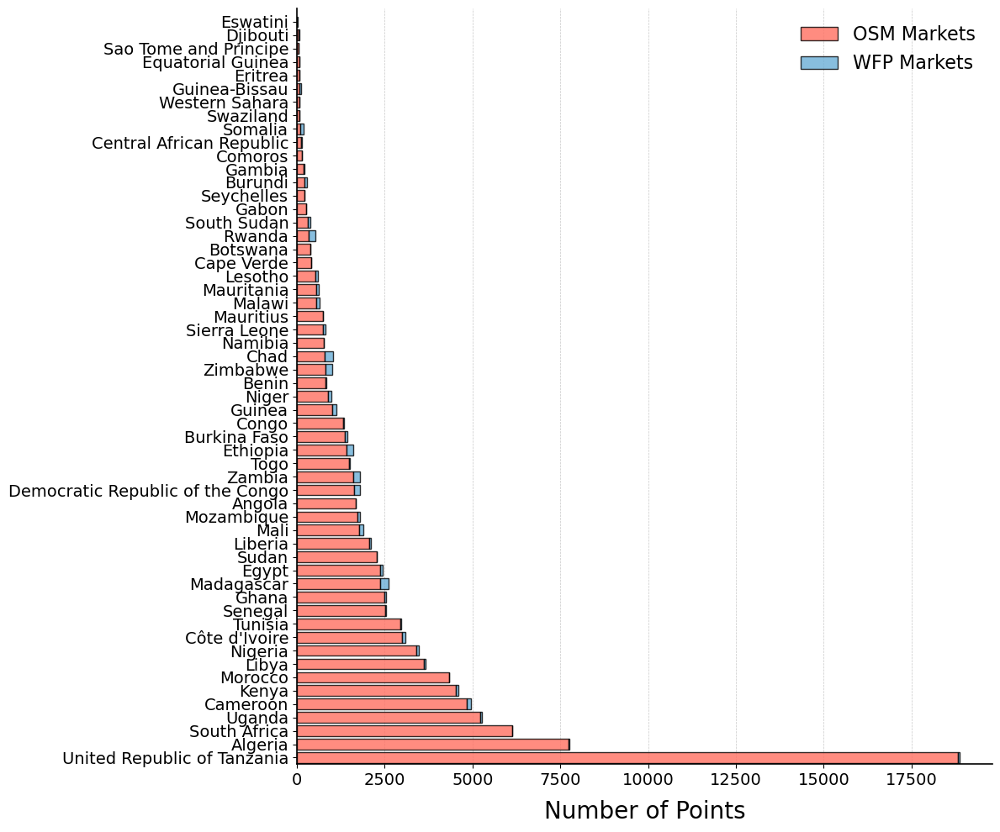

In [15]:
# Merge DataFrames and sort
merged_counts = pd.merge(pd.DataFrame(country_counts_osm), pd.DataFrame(country_counts_wfp), 
                         on='Country', how='outer', suffixes=('_OSM', '_WFP')).fillna(0)
merged_counts = merged_counts.sort_values('Count_OSM', ascending=False)

# Plot settings
fig, ax = plt.subplots(figsize=(12, 10))  # Taller height for better vertical spacing

# Bar positions and labels
countries = merged_counts['Country']
y = range(len(countries))
bar_height = 0.8

# Stacked horizontal bar plot
ax.barh(y, merged_counts['Count_OSM'], height=bar_height, label='OSM Markets',
        color='#FF6F61', edgecolor='black', alpha=0.8)

ax.barh(y, merged_counts['Count_WFP'], height=bar_height, label='WFP Markets',
        left=merged_counts['Count_OSM'], 
        color='#6BAED6', edgecolor='black', alpha=0.8)

# Add labels and improve layout
ax.set_xlabel('Number of Points', fontsize=20, labelpad=10)
ax.set_yticks(y)
ax.set_yticklabels(countries, fontsize=14)
ax.legend(fontsize=16, loc='upper right', frameon=False)
ax.tick_params('x', labelsize=14)

# Clean up plot edges
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1.2)
ax.spines['bottom'].set_linewidth(1.2)

# Add grid lines for better readability
ax.xaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_axisbelow(True)  # Ensure grid lines are behind the bars
ax.set_ylim(-0.5, len(countries))

# Adjust layout
plt.subplots_adjust(left=0.25, bottom=0.05, right=0.95, top=0.95)
plt.tight_layout()
plt.savefig('./figs/OSM_WFP_markets_barhplot.pdf', dpi=300)
plt.show()


## Plot of WFP and OSM points and centroids

In [16]:
 # read OSM data

market_WFP_all = pd.read_csv('../shared_data/markets_MFI_africa.csv')
market_price = pd.read_csv('../shared_data/markets_price_africa.csv')

market_WFP = pd.concat([market_WFP_all, market_price]).drop_duplicates(subset = 'MarketId', keep = 'first')

market_WFP_all['geometry'] = [Point(xy) for xy in zip(market_WFP_all.Longitude, market_WFP_all.Latitude)]

market_WFP_all = gpd.GeoDataFrame(market_WFP_all, geometry = 'geometry')

market_WFP_all.drop(['Latitude', 'Longitude'], inplace = True, axis = 1)
wfp_country_num = 0

market_OSM = gpd.GeoDataFrame()

# Define search radius in meters
radius = 200  
avg_ratio = 0
country_code = 'eth'
# country_code = 'nga'

market_OSM = gpd.read_file(f'../shared_data/africa_markets/markets/{country_code}_markets_shops.geojson')
crs = market_OSM.crs
utm_crs = market_OSM.estimate_utm_crs()

market_OSM = market_OSM.to_crs(utm_crs)
# get centroids if markets are polygons
market_OSM['geometry'] = market_OSM['geometry'].centroid
market_OSM = market_OSM.to_crs(crs)

# load the country borders
country_borders = gpd.read_file(f'../shared_data/africa_markets/borders/{country_code}.geojson')
country_borders = country_borders.to_crs(crs)
market_OSM['country'] = [country_borders.ADM0_NAME[0] for _ in range(len(market_OSM))]
# Get the WFP markets from the country considered

market_WFP_all = market_WFP_all.set_crs(crs)
market_WFP_country= market_WFP_all.sjoin(country_borders)
market_WFP_country.reset_index(inplace = True)
market_WFP = market_WFP_country
prev_len = len(market_WFP)

market_OSM = market_OSM.to_crs(market_OSM.estimate_utm_crs())
market_WFP_country = market_WFP_country.to_crs(market_OSM.estimate_utm_crs())

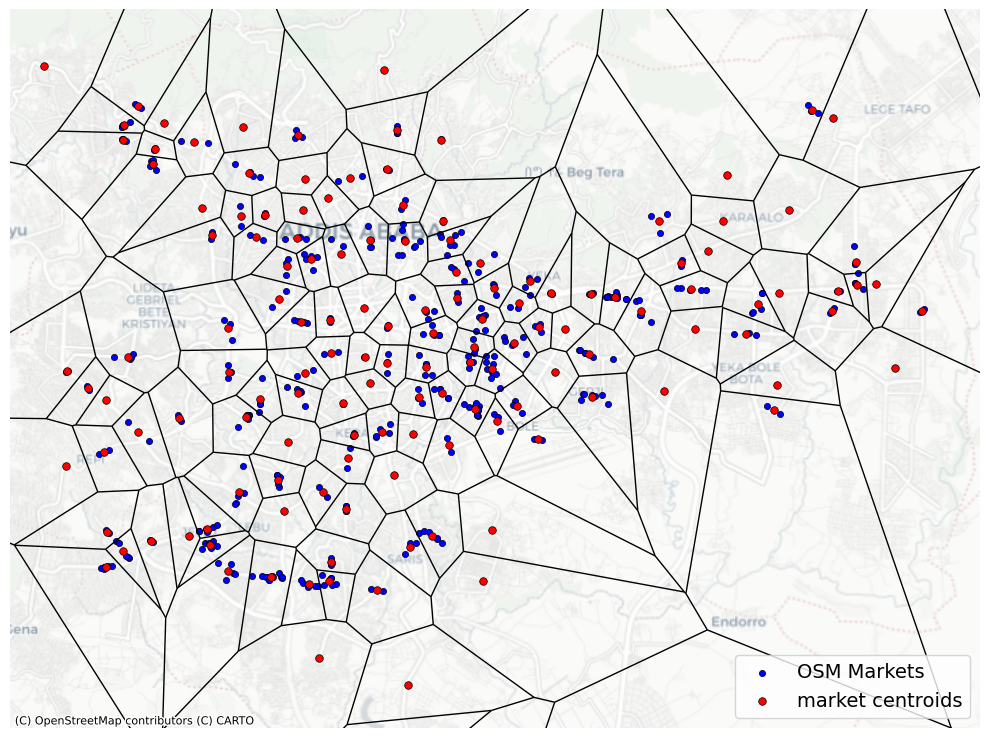

True


In [17]:
fig, ax = plt.subplots(figsize=(10, 8))  # Larger figure size for better clarity

centroid_gdf= gpd.read_file(f'./computed_centroids/{country_code}_centroids.geojson')
centroid_gdf = centroid_gdf.to_crs(market_OSM.crs)
# Turn off axis frames but keep ticks and labels for reference
ax.set_axis_on()
ax.tick_params(labelsize=12)
ax.grid(visible=False)

# Plot the WFP and OSM markets with enhanced markers
# market_WFP_country.plot(
#     ax=ax, 
#     markersize=30,  # Increased marker size for visibility
#     color='blue', 
#     label='WFP Markets', 
#     edgecolors='black', 
#     linewidths=0.5, 
#     marker='o'  # Diamond marker
# )
market_OSM.plot(
    ax=ax, 
    markersize=20, 
    color='blue', 
    label='OSM Markets', 
    edgecolors='black', 
    linewidths=0.5, 
    marker='o'  # Square marker
)

centroid_gdf.plot(ax=ax, 
    markersize=30, 
    color='red', 
    label='market centroids', 
    edgecolors='black', 
    linewidths=0.5, 
    marker='o'  # Square marker
)
# Add a legend with enhanced styling
ax.legend(fontsize=14, loc='lower right', title_fontsize=14, frameon=True)

# Extract coordinates from centroid geometries
points = np.array([(geom.x, geom.y) for geom in centroid_gdf.geometry])

# Compute Voronoi diagram
vor = Voronoi(points)

voronoi_plot_2d(vor, ax = ax, show_points = False, show_vertices = False)

# Add the counts as annotations on the plot
wfp_count = len(market_WFP)
osm_count = len(market_OSM)

# ax.annotate(
#     f'WFP Markets: {wfp_count}', 
#     xy=(0.05, 0.95), 
#     xycoords='axes fraction', 
#     fontsize=12, 
#     color='blue', 
#     ha='left', 
#     bbox=dict(facecolor='white', alpha=0.8, edgecolor='blue')
# )
# ax.annotate(
#     f'OSM Markets: {osm_count}', 
#     xy=(0.05, 0.10), 
#     xycoords='axes fraction', 
#     fontsize=12, 
#     color='red', 
#     ha='left', 
#     bbox=dict(facecolor='white', alpha=0.8, edgecolor='red')
# )
# ax.annotate(
#     f'market centroids: {len(centroid_gdf)}', 
#     xy=(0.05, 0.05), 
#     xycoords='axes fraction', 
#     fontsize=12, 
#     color='blue', 
#     ha='left', 
#     bbox=dict(facecolor='white', alpha=0.8, edgecolor='blue')
# )
ax.set_xlim(463000, 490000)
ax.set_ylim(0.985e6, 1.005e6)
ax.set_axis_off()
# Add a basemap with improved styling
cx.add_basemap(
    ax, 
    crs=market_OSM.crs, 
    source=cx.providers.CartoDB.Positron, 
    zoom=12, 
    zorder=0
)
# Adjust layout for better spacing and save the plot
plt.tight_layout()
# plt.savefig('./figs/OSM_WFP_markets_nga.pdf')  # Higher DPI for better quality
plt.show()

# Check geometry validity
print(market_OSM.geom_type.str.contains("Point").all())


# Accessibility Maps

##  Travel time to closest market Map: WALKING

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/3809601252.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


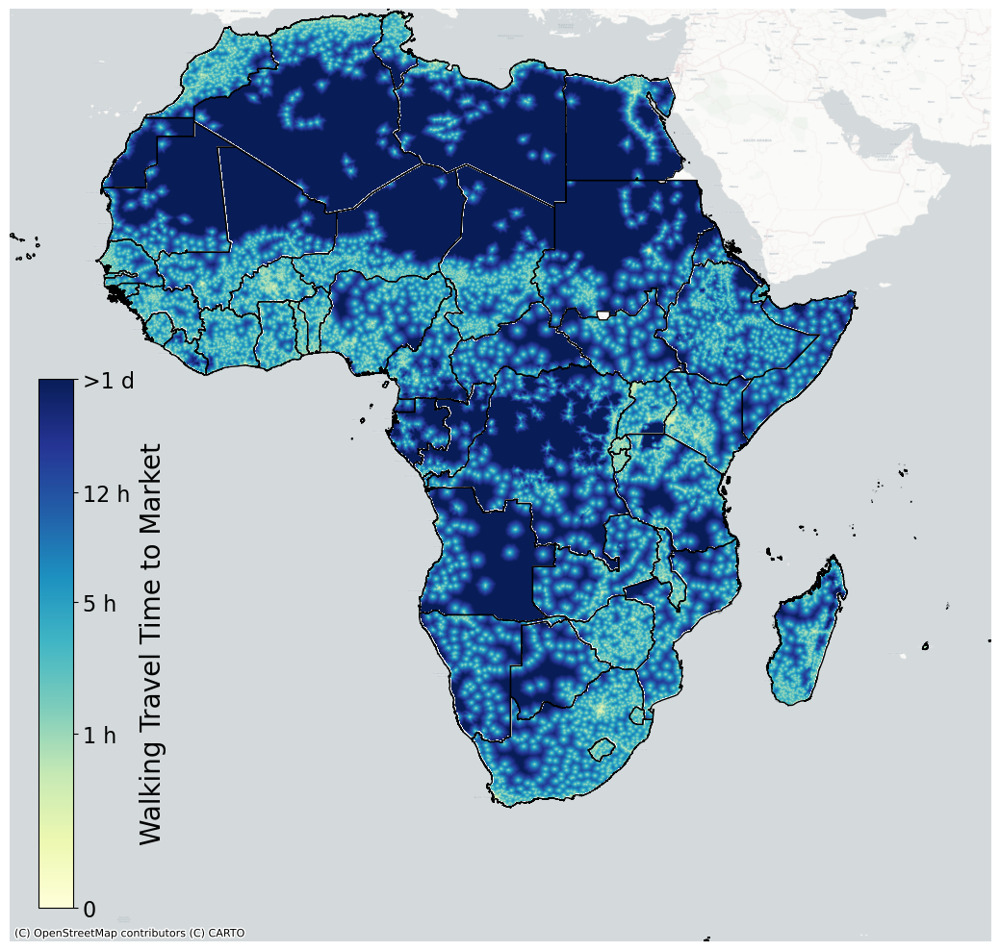

In [22]:
# %matplotlib widget
# %matplotlib notebook

# base_cmap = sns.color_palette("magma_r", as_cmap=True)
# Create the base colormap
cmap = sns.color_palette("YlGnBu", as_cmap=True)
# base_cmap = sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)

# Convert to a list of RGBA values
# colors = base_cmap(np.linspace(0, 1, 256))  # Sample 256 colors from the colormap

# Modify the top 10 colors (last 10 values in the list) by setting a different alpha
# for i in range(1, 21):  # Modify the last 10 colors
#     alpha = (i)/20
#     if alpha<0.5:
#         alpha = 0.5
#     colors[-i] = to_rgba(colors[-i], alpha=alpha) 


# Create a new colormap with modified colors
# cmap = ListedColormap(colors)

country_num_ls = os.listdir('./computed_acc')

# Set up a single plot
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_axis_off()

# Loop through the countries and plot
for country_num in country_num_ls:
    if country_num.endswith('.log'):
        continue
    if len(country_num) > 3:
        continue

    # Define paths
    acc_path = f"./computed_acc/{country_num}/shortest_walk_tt.tif"

    if os.path.exists(acc_path):
        pass
    else:
        print(country_num)
        continue
    # Load the raster data

    acc_raster = rasterio.open(acc_path, 'r')
    transform = acc_raster.transform
    bounds = acc_raster.bounds
    acc_mat = acc_raster.read()[0]
    # acc_mat =  acc_raster.read()
    # if len(acc_mat.shape) > 2:
    #     acc_mat = acc_mat[0]

    #Load WorldPop to get extent and Transform(?)
    # for path in os.listdir(f"../shared_data/worldpop_rasters/{country_num}"):
    #     if path.endswith('cropped.tif'):
    #         chosen_path = path
    # with rasterio.open(f"../shared_data/worldpop_rasters/{country_num}"+\
    #                    "/"+chosen_path, "r") as src:
    #     transform = src.transform
    #     bounds = src.bounds
        
    # Load country boundaries
    country_gdf = gpd.read_file(f"../shared_data/africa_markets/borders/{country_num}.geojson")
    
    country_mask = np.zeros_like(acc_mat)
    country_mask[acc_mat >=0] = 1
    # Compute bounds and transform
    # bounds = country_gdf.total_bounds  # [minx, miny, maxx, maxy]
    # transform = from_bounds(bounds[0], bounds[1], bounds[2], bounds[3],
    #                         shortest_tt_rast.shape[1], shortest_tt_rast.shape[0])

    # Plot raster
    img = ax.imshow(acc_mat, extent=(bounds[0], bounds[2], bounds[1], bounds[3]),
                    cmap=cmap, alpha = country_mask, zorder=2, 
                    norm = colors.PowerNorm(gamma=0.35, vmin=0, vmax=1440))

    # Plot country boundaries
    country_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1, zorder=3)

# Add basemap (lower z-order to stay below the plots)
cx.add_basemap(ax, crs=country_gdf.crs, source=cx.providers.CartoDB.Positron, zoom=6, zorder=1)

# Add a small colorbar in a custom position
# Define custom position as [left, bottom, width, height] in figure coordinates (0 to 1 range)
colorbar_axes = fig.add_axes([0.1, 0.05, 0.03, 0.55])  # Adjust the position and size
cbar = fig.colorbar(img, cax=colorbar_axes, ticks=[0, 60, 300, 720, 1440],
                    format=mticker.FixedFormatter(['0', '1 h', '5 h', '12 h', '>1 d']))
cbar.set_label('Walking Travel Time to Market', fontsize = 20)
cbar.ax.tick_params(labelsize = 16)
plt.tight_layout()
# plt.savefig('./figs/walking_tt_africa.pdf', bbox_inches='tight')
plt.show()

##  Travel time to closest market Map: MOTORIZED

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_88985/2477041212.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


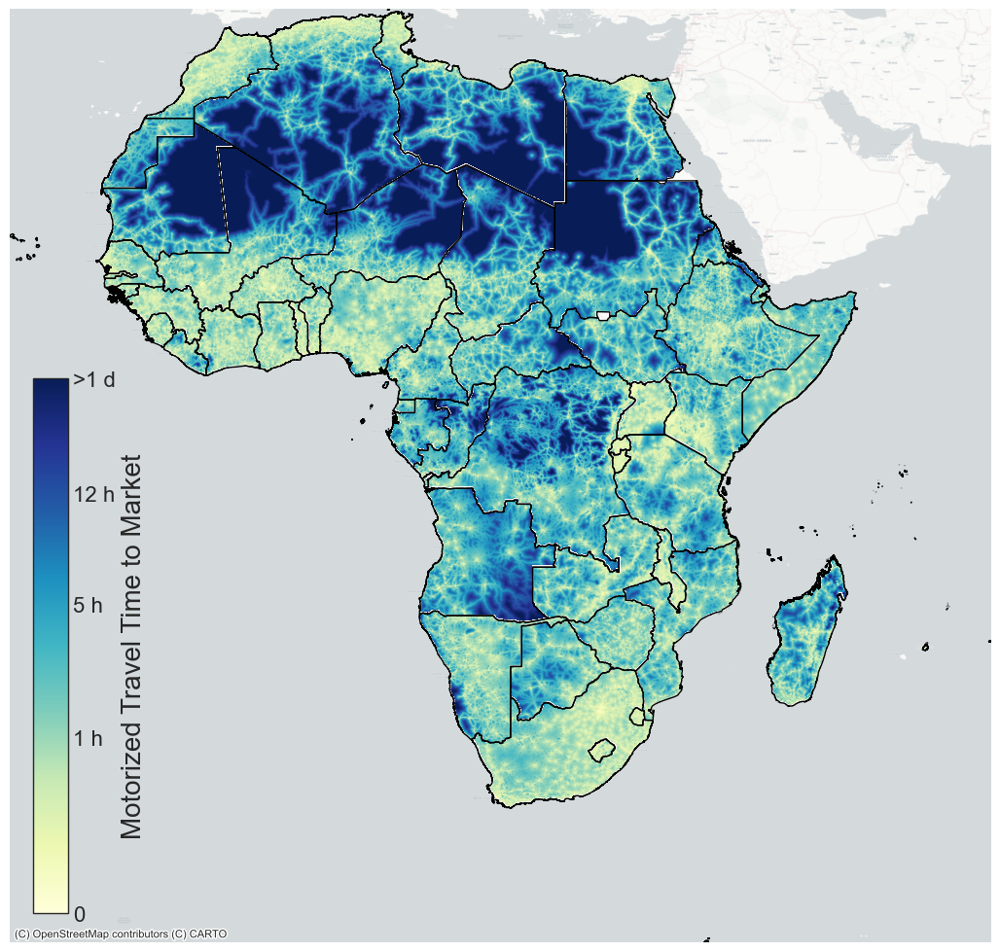

In [374]:
# %matplotlib widget
# %matplotlib notebook

country_num_ls = os.listdir('./computed_acc')
cmap = 'YlGnBu'
# Set up a single plot
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_axis_off()

# Loop through the countries and plot
for country_num in country_num_ls:
    if country_num.endswith('.log'):
        continue
    if len(country_num) > 3:
        continue
    # Define paths
    acc_path = f"./computed_acc/{country_num}/shortest_moto_tt.tif"

    if os.path.exists(acc_path):
        pass
    else:
        print(country_num)
        continue
    # Load the raster data

    acc_raster = rasterio.open(acc_path, 'r')
    transform = acc_raster.transform
    bounds = acc_raster.bounds
    acc_mat = acc_raster.read()[0]

        
    # Load country boundaries
    country_gdf = gpd.read_file(f"../shared_data/africa_markets/borders/{country_num}.geojson")
    
    country_mask = np.zeros_like(acc_mat)
    country_mask[acc_mat >=0] = 1

    # Plot raster
    img = ax.imshow(acc_mat, extent=(bounds[0], bounds[2], bounds[1], bounds[3]),
                    cmap=cmap, alpha = country_mask, zorder=2, norm = colors.PowerNorm(gamma=0.35, vmin=0, vmax=1440))
                    # norm = colors.LogNorm(vmin=10, vmax=1440))

    # Plot country boundaries
    country_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1, zorder=3)

# Add basemap (lower z-order to stay below the plots)
cx.add_basemap(ax, crs=country_gdf.crs, source=cx.providers.CartoDB.Positron, zoom=6, zorder=1)

# Add a small colorbar in a custom position
# Define custom position as [left, bottom, width, height] in figure coordinates (0 to 1 range)
colorbar_axes = fig.add_axes([0.1, 0.05, 0.03, 0.55])  # Adjust the position and size
cbar = fig.colorbar(img, cax=colorbar_axes, ticks=[0, 60, 300, 720, 1440],
                    format=mticker.FixedFormatter(['0', '1 h', '5 h', '12 h', '>1 d']))
cbar.set_label('Motorized Travel Time to Market', fontsize=20)
cbar.ax.tick_params(labelsize = 16, size=0)
plt.tight_layout()
plt.savefig('./figs/moto_tt_africa.pdf', bbox_inches='tight')
plt.show()


## Entropy map

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_88985/710930703.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


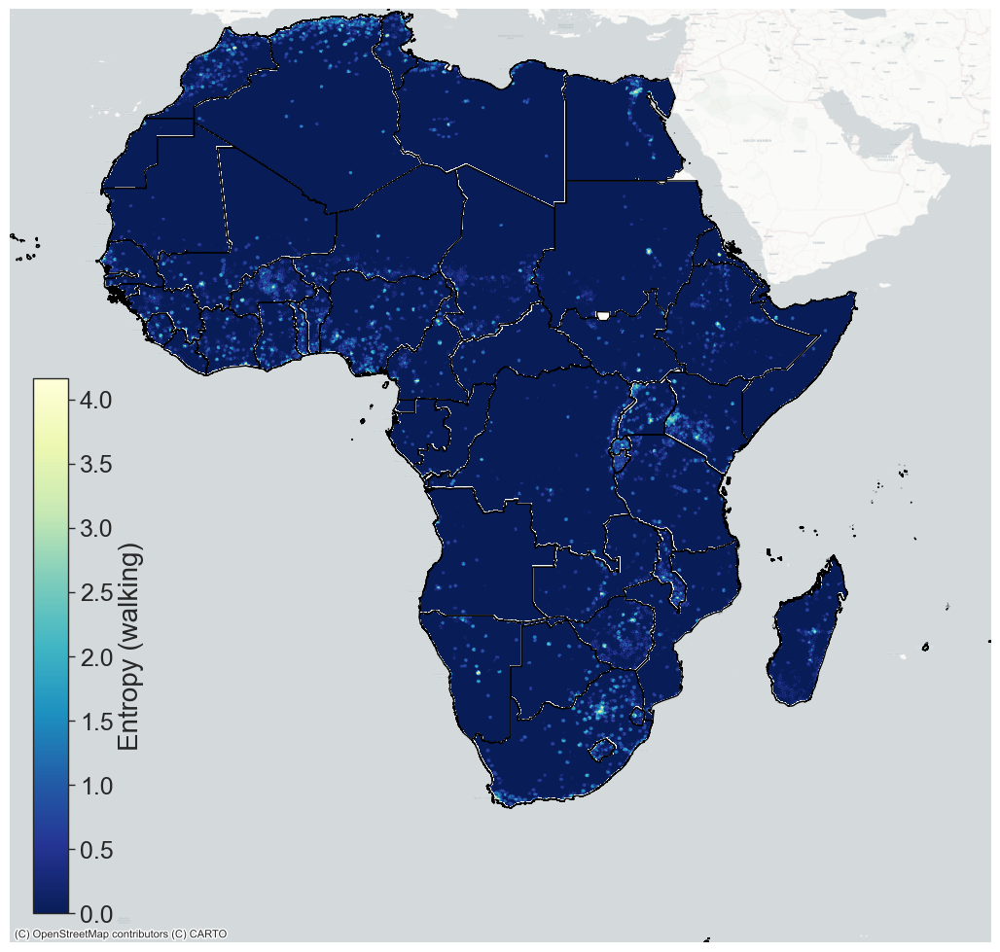

In [378]:
country_num_ls = os.listdir('./computed_acc')

# Set up a single plot
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_axis_off()

# Loop through the countries and plot
for country_num in country_num_ls:
    if country_num.endswith('.log'):
        continue
    if len(country_num) > 3:
        continue
    # Define paths
    acc_path = f"./computed_acc/{country_num}/entropy_mod_4h_walk.tif"
    if os.path.exists(acc_path):
        pass
    else:
        print(country_num)
        continue
    # Load the raster data

    acc_raster = rasterio.open(acc_path, 'r')
    transform = acc_raster.transform
    bounds = acc_raster.bounds
    acc_mat = acc_raster.read()[0]

    # Load country boundaries
    country_gdf = gpd.read_file(f"../shared_data/africa_markets/borders/{country_num}.geojson")
    
    country_mask = np.zeros_like(acc_mat)
    country_mask[acc_mat >=0] = 1
    # Plot raster
    img = ax.imshow(acc_mat, extent=(bounds[0], bounds[2], bounds[1], bounds[3]),
              cmap='YlGnBu_r', alpha = country_mask, zorder=2)

    # Plot country boundaries
    country_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1, zorder=3)

# Add basemap (lower z-order to stay below the plots)
cx.add_basemap(ax, crs=country_gdf.crs, source=cx.providers.CartoDB.Positron, zoom=6, zorder=1)#cx.providers.OpenStreetMap.Mapnik

# Add a small colorbar in a custom position
# Define custom position as [left, bottom, width, height] in figure coordinates (0 to 1 range)
colorbar_axes = fig.add_axes([0.1, 0.05, 0.03, 0.55])  # Adjust the position and size
cbar = fig.colorbar(img, cax=colorbar_axes)
cbar.set_label('Entropy (walking)', fontsize=20)
cbar.ax.tick_params(labelsize = 18)
plt.tight_layout()
# plt.savefig('./figs/entropy_moto.pdf', bbox_inches='tight')
plt.savefig('./figs/entropy_walk.pdf', bbox_inches='tight')
plt.show()

## Number of Markets in 30 min (cumulative)

Error processing country .DS_Store: ./computed_acc/.DS_Store/acc_pure_cumul_walk.tif: Not a directory
Error processing country sensitivity: ./computed_acc/sensitivity/acc_pure_cumul_walk.tif: No such file or directory
Error processing country .DS_Store: ./computed_acc/.DS_Store/acc_pure_cumul_walk.tif: Not a directory
Error processing country sensitivity: ./computed_acc/sensitivity/acc_pure_cumul_walk.tif: No such file or directory


/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2176161862.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


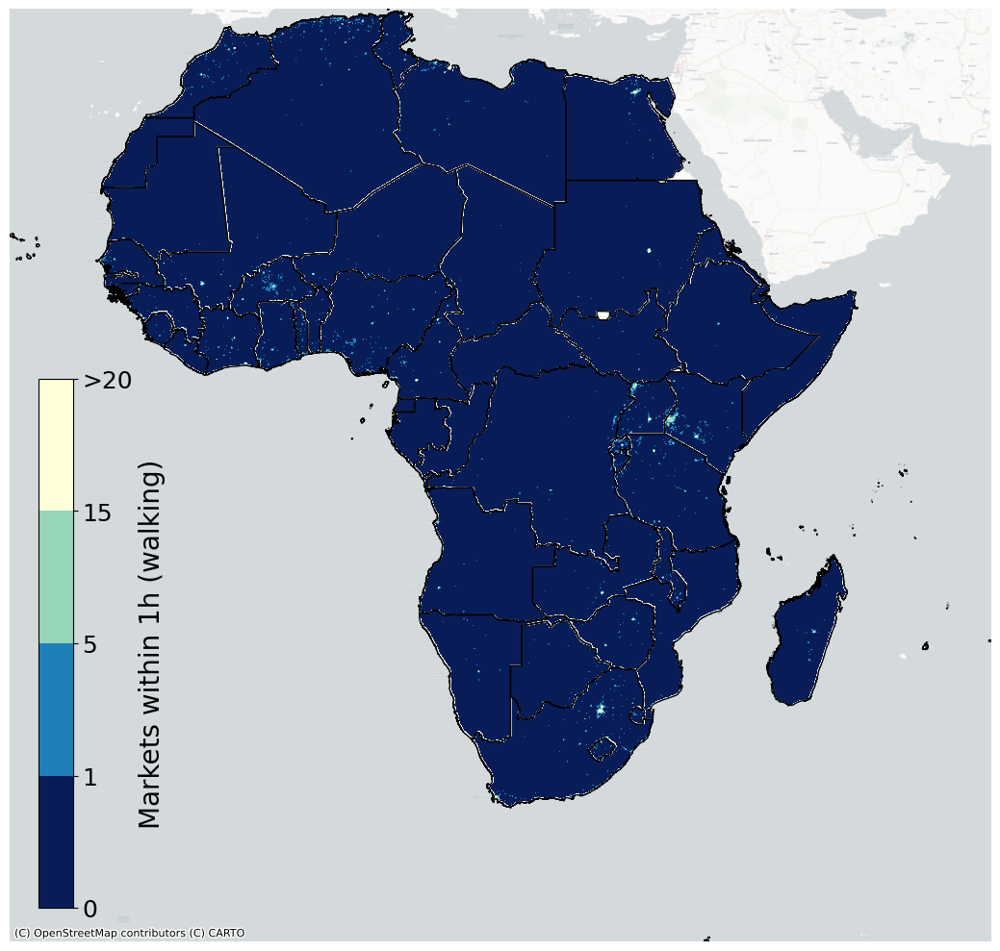

In [23]:
# List of countries
country_num_ls = os.listdir('./computed_acc')

# Set up a single plot
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_axis_off()

# Initialize an empty list to store all values for calculating percentiles
all_values = []

# First pass: collect all non-negative values from loaded arrays for percentile calculation
for country_num in country_num_ls:
    acc_path = f"./computed_acc/{country_num}/acc_pure_cumul_walk.tif"
#     acc_path = f"./computed_acc/{country_num}/acc_pure_cumul_moto.tif"

    # Load the raster data
    try:
        acc_raster = rasterio.open(acc_path, 'r')
        transform = acc_raster.transform
        bounds = acc_raster.bounds
        acc_mat = acc_raster.read()[0]

        # Append non-negative values to all_values
        all_values.extend(acc_mat[acc_mat > 0].flatten())
    except Exception as e:
        print(f"Error processing country {country_num}: {e}")
        continue


base_cmap = sns.color_palette("YlGnBu_r", as_cmap=True)

# Use this for Motorized travel
# norm = BoundaryNorm([0, 1, 10, 25, 50, 100], base_cmap.N)

# Use this for Walking travel
norm = BoundaryNorm([0, 1, 5, 15, 20], base_cmap.N)

# Define power normalization
# norm = colors.PowerNorm(gamma=0.2, vmin=0, vmax=100, clip=False)

# Second pass: plot the data
for country_num in country_num_ls:

# Use this for Walking travel
    acc_path = f"./computed_acc/{country_num}/acc_pure_cumul_walk.tif"

# Use this for Motorized travel
#     acc_path = f"./computed_acc/{country_num}/acc_pure_cumul_moto.tif"

    # Load the raster data
    try:
        acc_raster = rasterio.open(acc_path, 'r')
        transform = acc_raster.transform
        bounds = acc_raster.bounds
        acc_mat = acc_raster.read()[0]

        # Load country boundaries
        country_gdf = gpd.read_file(f"../shared_data/africa_markets/borders/{country_num}.geojson")

        # Mask values for plotting
        country_mask = np.zeros_like(acc_mat)
        country_mask[acc_mat >= 0] = 1
        # Plot raster
        img = ax.imshow(acc_mat, extent=(bounds[0], bounds[2], bounds[1], bounds[3]),
                        cmap=base_cmap, norm=norm, alpha=country_mask, zorder=2)

        # Plot country boundaries
        country_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1, zorder=3)

    except Exception as e:
        print(f"Error processing country {country_num}: {e}")
        continue

# Add basemap (lower z-order to stay below the plots)
cx.add_basemap(ax, crs=country_gdf.crs, source=cx.providers.CartoDB.Positron, zoom=6, zorder=1)

# Add a small colorbar in a custom position
colorbar_axes = fig.add_axes([0.1, 0.05, 0.03, 0.55])  # Adjust the position and size+

# Use this for Motorized travel
# cbar = fig.colorbar(img, cax=colorbar_axes, ticks=[0, 1, 10, 25, 50, 100], 
#                     format=mticker.FixedFormatter(['0', '1','10', '25', '50', '>100']))

# Use this for Walking travel
cbar = fig.colorbar(img, cax=colorbar_axes, ticks=[0, 1, 5, 15, 20], 
                    format=mticker.FixedFormatter(['0', '1','5', '15', '>20']))

cbar.set_label('Markets within 1h (walking)', fontsize=20)
cbar.ax.tick_params(labelsize=18)

plt.tight_layout()
plt.savefig('./figs/pure_cumul_1h_walk.pdf', bbox_inches='tight')
# plt.savefig('./figs/pure_cumul_30min_moto.pdf', bbox_inches='tight')

plt.show()


## Correlation Between all metrics

In [24]:
# List of countries
country_num_ls = os.listdir('./computed_acc')
# country_num_ls = ['79', '182']


# Iterate over each country
# acc_ls = ['shortest_moto_tt', 'entropy', 'acc_cumul', 'acc_pure_cumul', 'entropy_mod_4h']
acc_ls = ['shortest_moto_tt','shortest_walk_tt', 'acc_pure_cumul_moto', 'entropy_mod_4h_moto']
pearson_mat = np.zeros((len(acc_ls),len(acc_ls)))
spearman_mat = np.zeros((len(acc_ls),len(acc_ls)))

pval_mat = np.zeros((len(acc_ls),len(acc_ls)))


for i in range(len(acc_ls)):
    for j in range(i, len(acc_ls)):
        if i == j:
            pearson_mat[i,j] = spearman_mat[i,j] = 1
            continue
        spearmanr_ls = []
        pearsonr_ls = []
        for country_num in country_num_ls:
            if len(country_num)!= 3:
                continue
                
            acc_path_1 = f"./computed_acc/{country_num}/{acc_ls[i]}.tif"
            acc_path_2 = f"./computed_acc/{country_num}/{acc_ls[j]}.tif"
        
            # Load the raster data
            try:
                with rasterio.open(acc_path_1, "r") as f:
                    arr1 = f.read()[0]
                arr1_flat = arr1.flatten()
            except Exception as e:
                print(f"Error processing acc_pure_cumul for country {country_num}: {e}")
                continue
        
            try:
                with rasterio.open(acc_path_2, "r") as f:
                    arr2 = f.read()[0]
                arr2_flat = arr2.flatten()
            except Exception as e:
                print(f"Error processing walking tt for country {country_num}: {e}")
                continue
        
            # Create a mask to filter out NaN values from both arrays
            mask = ~np.isnan(arr2_flat) & ~np.isnan(arr1_flat)
            arr2_flat_filtered = arr2_flat[mask]
            arr1_flat_filtered = arr1_flat[mask]
        
            # Ensure there are enough valid data points
            if len(arr2_flat_filtered) == 0 or len(arr1_flat_filtered) == 0:
                print(f"Not enough valid data for country {country_num}")
                continue
        
            # Calculate correlations
            try:
                spearman_corr = spearmanr(arr2_flat_filtered, arr1_flat_filtered, nan_policy='omit')
                pearson_corr = pearsonr(arr2_flat_filtered, arr1_flat_filtered)
                spearmanr_ls.append(list(spearman_corr))
                pearsonr_ls.append(list(pearson_corr))
                # print(list(spearman_corr))
                # print(f'Spearman {country_num}: {spearman_corr}')
                # print(f'Pearson {country_num}: {pearson_corr}')
            except Exception as e:
                print(f"Error calculating correlations for country {country_num}: {e}")
        
        spearmanr_ls = np.array(spearmanr_ls)
        pearsonr_ls = np.array(pearsonr_ls)
        
        pearson_mat[i,j] = pearsonr_ls[:, 0].mean()
        spearman_mat[i,j] = spearmanr_ls[:, 0].mean()
        pval_mat[i,j] = spearmanr_ls[:, 1].mean()

    
        pearson_mat[j,i] = pearsonr_ls[:, 0].mean()
        spearman_mat[j,i] = spearmanr_ls[:, 0].mean()
        pval_mat[j,i] = spearmanr_ls[:, 1].mean()

print(spearmanr_ls[:, 0].mean(), pearsonr_ls[:, 0].mean(), spearmanr_ls[:, 0].std(), 
      pearsonr_ls[:, 0].std(), spearmanr_ls[:, 1].mean(), pearsonr_ls[:, 1].mean())



0.32852411046576474 0.349132576727284 0.1734392186799944 0.13490927625227941 0.008278527426261775 1.3960782078603299e-58


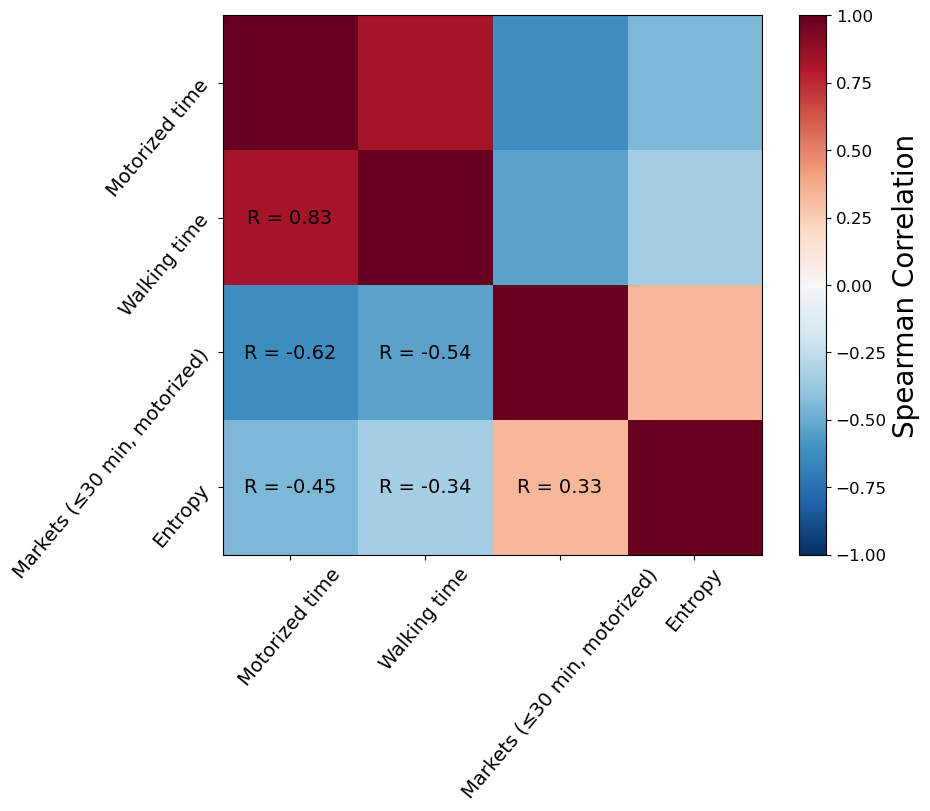

[[ 1.          0.82697873 -0.62113881 -0.44670694]
 [ 0.82697873  1.         -0.53787471 -0.34006459]
 [-0.62113881 -0.53787471  1.          0.32852411]
 [-0.44670694 -0.34006459  0.32852411  1.        ]]


<Figure size 640x480 with 0 Axes>

In [25]:
fig, ax = plt.subplots(figsize=(10, 8), constrained_layout=True)  # Adjusted size for better visualization
label_ls = ['Motorized time', 'Walking time', 'Markets (≤30 min, motorized)', 'Entropy']

# Display the Pearson matrix
# cax1 = ax[0].matshow(pearson_mat, cmap='RdBu_r', vmin=-1, vmax=1)
# ax[0].set_title('Pearson Correlation', fontsize=14)

# Display the Spearman matrix
cax1 = ax.imshow(spearman_mat, cmap='RdBu_r', vmin=-1, vmax=1)
# ax[1].set_title('Spearman Correlation', fontsize=14)

# Common colorbar
cbar = fig.colorbar(cax1, ax=ax, location='right', label='Spearman Correlation')

# Set colorbar label (title) font size
cbar.set_label('Spearman Correlation', fontsize=20)  

# Set tick label font size
cbar.ax.tick_params(labelsize=12)
# Turn off grid lines
# ax[0].grid(False)
ax.grid(False)

# Set x and y tick labels for the first matrix
# ax[0].set_xticks(range(len(acc_ls)))
# ax[0].set_xticklabels(label_ls, rotation=50, fontsize=14)
# ax[0].set_yticks(range(len(acc_ls)))
# ax[0].set_yticklabels(label_ls, rotation=50, fontsize=14)
# ax[0].text(0.26, -0.07, 'Pearson Correlation', transform=ax[0].transAxes, fontsize=18, verticalalignment='bottom')

# Set x tick labels for the second matrix
ax.set_xticks(range(len(acc_ls)))
ax.set_xticklabels(label_ls, rotation=50, fontsize=14)
ax.set_yticks(range(len(acc_ls)))
ax.set_yticklabels(label_ls, rotation=50, fontsize=14)  # Hide y-axis labels for the second matrix

# Loop over data dimensions and create text annotations.
for i in range(pval_mat.shape[0]):
    for j in range(pval_mat.shape[1]):
        pval = pval_mat[i, j]
        if pval < 0.05:
            text_str = ''
        else:
            text_str = '\n \n'+f'p = {round(pval, 3)}'
        text = ax.text(j, i, text_str,
                       ha="center", va="center", color="black")

# Loop over data dimensions and create text annotations.
for i in range(spearman_mat.shape[0]):
    for j in range(spearman_mat.shape[1]):
        Rval = spearman_mat[i, j]

        text_str = f'R = {round(Rval, 2)}'
        if i <= j:
            text_str = ' '
        text = ax.text(j, i, text_str,
                       ha="center", va="center", color="black", fontsize = 14)
# ax.text(0.2, -0.07, 'Spearman Correlation', transform=ax.transAxes, fontsize=18, verticalalignment='bottom')
plt.show()
# plt.savefig('./figs/pixel_correlation.pdf')
print(spearman_mat)

## Top and Bottom 10 countries for each accessibility

In [26]:
country_num_ls = os.listdir('./computed_acc')
country_avg_gdf = gpd.GeoDataFrame()

In [27]:
# south sudan, sudan and senegal
    
# List of countries
# request_fails = []
# Set up a single plot
wrong_numbers = {74:70001, 6: 40764, 217:278}
cmap = matplotlib.colormaps['RdBu_r']
# norm = BoundaryNorm(percentile_bins, cmap.N)
request_fails = []
africa_gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')
# Second pass: plot the data
for country_iso3 in country_num_ls:
    
    try:
        country_num = int(africa_gdf.loc[africa_gdf['ISO3'] == country_iso3.upper()]['ADM0_CODE'].values[0])
    except:
        continue
    print(country_num)    
        
    # Load WorldPop to get extent and transform
    for path in os.listdir(f"../shared_data/worldpop_rasters/{country_iso3}"):
        if path.endswith('cropped.tif'):
            chosen_path = path
    wpp_path = f"../shared_data/worldpop_rasters/{country_iso3}/{chosen_path}"
    with rasterio.open(wpp_path, "r") as src:
        worldpop_arr = src.read()[0]
        worldpop_arr = np.where(worldpop_arr<0, 0, worldpop_arr)
    
    # print('loaded population')
    # acc_path_cumul = f'./computed_acc/{country_iso3}/acc_cumul.tif'
    en_path = f'./computed_acc/{country_iso3}/entropy_mod_4h_moto.tif'
    shortest_tt_path = f'./computed_acc/{country_iso3}/shortest_moto_tt.tif'
    shortest_walinkg_tt_path = f'./computed_acc/{country_iso3}/shortest_walk_tt.tif'
    acc_path_pure_cumul = f'./computed_acc/{country_iso3}/acc_pure_cumul_moto.tif'

    with rasterio.open(en_path, 'r') as f:
        
        entropy = align_extent_raster(wpp_path, f)[0]

    # print('loaded entropy')

    with rasterio.open(shortest_tt_path, 'r') as f:
        shortest_tt = align_extent_raster(wpp_path, f)[0]


    with rasterio.open(shortest_walinkg_tt_path, 'r') as f:
        shortest_walking_tt = align_extent_raster(wpp_path, f)[0]

    # print('loaded shortest tt.')

    with rasterio.open(acc_path_pure_cumul, 'r') as f:
        acc_pure_cumul = align_extent_raster(wpp_path, f)[0]

    # print('threshold cumul')

    # Load country boundaries
    try:
        # if country_num in wrong_numbers.keys():
        #     correct_num = wrong_numbers[country_num]
        # else:
            # correct_num = country_num
        country_adm_gdf = gpd.read_file(f'../shared_data/africa_markets/borders/{country_iso3}.geojson')
        # country_adm_gdf['country_num'] = np.ones(len(country_adm_gdf))*country_num
        
    except Exception as e:
        print(e)
        request_fails.append(country_iso3)
        continue

    populations = []
    # acc_cumul_admin = []
    short_tt_admin = []
    entropy_adm = []
    pure_cumul_adm = []
    RI_admin = []
    walk_tt_adm = []

    # admin_median_cumul = []
    admin_median_moto_tt = []
    admin_median_walking_tt = []
    admin_median_pure_cumul = []
    admin_median_entr = []
    
    rur_urb_rast = rasterio.open('../shared_data/urban_rural_catchment_areas.tif')
    # Align the Worldpop and Rural-Urban rasters
    rur_urb_arr = align_extent_raster(wpp_path, rur_urb_rast)[0]
    class_rur_urb_arr = build_class_rurub_arr(rur_urb_arr)
            
    for i, poly in enumerate(country_adm_gdf['geometry']):

        src = rasterio.open(wpp_path, "r")
        
        clipped_rast, _, _ =  raster_geometry_mask(src, [mapping(poly)], 
                                                crop=False, invert = True, all_touched = True)
        
        true_points = ~(np.ones_like(clipped_rast)&clipped_rast)
        # take the smallest points and use them as the top left of your crop
        top_left = true_points.min(axis=0)
        # take the largest points and use them as the bottom right of your crop
        bottom_right = true_points.max(axis=0)

        RI_masked = np.copy(class_rur_urb_arr)
        RI_masked[true_points] = 0
        RI_masked[RI_masked<0] = 0
    
        # access_mat_cumul_masked = np.copy(access_mat_cumul)
        # access_mat_cumul_masked[true_points] = 0
    
        pure_cumul_masked = np.copy(acc_pure_cumul)
        pure_cumul_masked[true_points] = 0
    
        shortest_tt_rast_masked = np.copy(shortest_tt)
        shortest_tt_rast_masked[true_points] = 0
        
        shortest_tt_walking_masked = np.copy(shortest_walking_tt)
        shortest_tt_walking_masked[true_points] = 0
            
        entropy_masked = np.copy(entropy)
        entropy_masked[true_points] = 0
    
        pop_masked_arr = np.copy(worldpop_arr)
        pop_masked_arr[true_points] = 0
    
        pop_masked_arr[pop_masked_arr < 0] = 0
        tot_pop = np.sum(pop_masked_arr)
    
        pop_masked_arr_tt = np.copy(pop_masked_arr)
        pop_masked_arr_tt[np.isinf(shortest_tt_rast_masked)] = np.nan
        pop_masked_arr_tt[np.isnan(shortest_tt_rast_masked)] = np.nan
    
        shortest_tt_rast_masked[np.isinf(shortest_tt_rast_masked)] = np.nan
        shortest_tt_rast_masked[np.isnan(shortest_tt_rast_masked)] = np.nan

        shortest_tt_walking_masked[np.isinf(shortest_tt_walking_masked)] = np.nan
        shortest_tt_walking_masked[np.isnan(shortest_tt_walking_masked)] = np.nan
        
        pop_masked_arr_entropy = np.copy(pop_masked_arr)
        pop_masked_arr_entropy[np.isinf(entropy_masked)] = np.nan
        pop_masked_arr_entropy[np.isnan(entropy_masked)] = np.nan
    
        entropy_masked[np.isinf(entropy_masked)] = 0
        entropy_masked[np.isnan(entropy_masked)] = 0
        
    
        if tot_pop > 0:
            # weights = pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)].flatten()
            # values = access_mat_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)].flatten()
            # median_cumul = weighted_median(values, weights)
            
            # weighted_mean_acc_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)] *\
            #                                  access_mat_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(access_mat_cumul_masked)]))

            weights = pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)].flatten()
            values = pure_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)].flatten()
            median_pure_cumul = weighted_median(values, weights)
            
            weighted_mean_pure_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)] *\
                                             pure_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(pure_cumul_masked)]))
            
            weights = pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(shortest_tt_rast_masked)].flatten()
            values = shortest_tt_rast_masked[np.isfinite(pop_masked_arr) & np.isfinite(shortest_tt_rast_masked)].flatten()
            median_moto_tt = weighted_median(values, weights)
            
            weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked) & np.isfinite(pop_masked_arr)]))

            weights = pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(shortest_tt_walking_masked)].flatten()
            values = shortest_tt_walking_masked[np.isfinite(pop_masked_arr) & np.isfinite(shortest_tt_walking_masked)].flatten()
            median_walk_tt = weighted_median(values, weights)
            
            weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked) & np.isfinite(pop_masked_arr)]))

            weights = pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(entropy_masked)].flatten()
            values = entropy_masked[np.isfinite(pop_masked_arr) & np.isfinite(entropy_masked)].flatten()
            median_entropy = weighted_median(values, weights)
            
            weighted_mean_entr = np.nansum(pop_masked_arr[np.isfinite(entropy_masked)] * entropy_masked[np.isfinite(entropy_masked)]\
                                        /np.nansum(pop_masked_arr[np.isfinite(entropy_masked)]))
            
            weighted_mean_RI = np.nansum(pop_masked_arr[np.isfinite(RI_masked)] * RI_masked[np.isfinite(RI_masked)]\
                          /np.nansum(pop_masked_arr[np.isfinite(RI_masked)]))
    
        else:
            # Handle cases where population is zero to avoid division by zero
            median_entropy = 0
            median_moto_tt = 0
            median_pure_cumul = 0
            median_walk_tt = 0
            # median_cumul = 0
            
            # weighted_mean_acc_cumul = 0
            weighted_mean_tt = 0
            weighted_mean_entr = 0 
            weighted_mean_pure_cumul = 0
            weighted_mean_RI = 0
            weighted_mean_walking_tt = 0
            
        populations.append(tot_pop)
        # acc_cumul_admin.append(weighted_mean_acc_cumul)
        short_tt_admin.append(weighted_mean_tt)
        entropy_adm.append(weighted_mean_entr)
        pure_cumul_adm.append(weighted_mean_pure_cumul)
        RI_admin.append(weighted_mean_RI)
        walk_tt_adm.append(weighted_mean_walking_tt)

        # admin_median_cumul.append(median_cumul)
        admin_median_moto_tt.append(median_moto_tt)
        admin_median_walking_tt.append(median_walk_tt)
        admin_median_pure_cumul.append(median_pure_cumul)
        admin_median_entr.append(median_entropy)
        
    country_adm_gdf = country_adm_gdf[[c for c in country_adm_gdf.columns if 
                                           not c.endswith('_right') and not 
                                           c.endswith('_left') and not 
                                           c.endswith('_y')]]
    
    country_adm_gdf['tot_pop'] = populations
    # country_adm_gdf['acc_cumul'] = acc_cumul_admin
    country_adm_gdf['shortest_tt'] = short_tt_admin
    country_adm_gdf['entropy'] = entropy_adm
    country_adm_gdf['pure_cumul'] = pure_cumul_adm
    country_adm_gdf['RI'] = RI_admin
    country_adm_gdf['shortest_tt_walk'] = walk_tt_adm

    # country_adm_gdf['acc_cumul_median'] = admin_median_cumul
    country_adm_gdf['shortest_tt_median'] = admin_median_moto_tt
    country_adm_gdf['entropy_median'] = admin_median_entr
    country_adm_gdf['pure_cumul_median'] = admin_median_pure_cumul
    country_adm_gdf['shortest_tt_walk_median'] = admin_median_walking_tt
    
    if len(country_avg_gdf) == 0:
        country_avg_gdf = country_adm_gdf
    else:
        country_avg_gdf = gpd.GeoDataFrame(pd.concat([country_avg_gdf, country_adm_gdf], ignore_index=True), crs = country_adm_gdf.crs)
    
    # sleep(5)
country_num_ls = request_fails
print(country_num_ls)

220
90
76
74
49
169
94
105
8
271
205
181
6
248
145
77
226
221
152
43
59
170
243
155
66
214
4
50
150
35
40765
45
89
42
29
253
70
47
160
79
172
182
217
159
144
257
133
227
68
235
106
142
58
270
[]


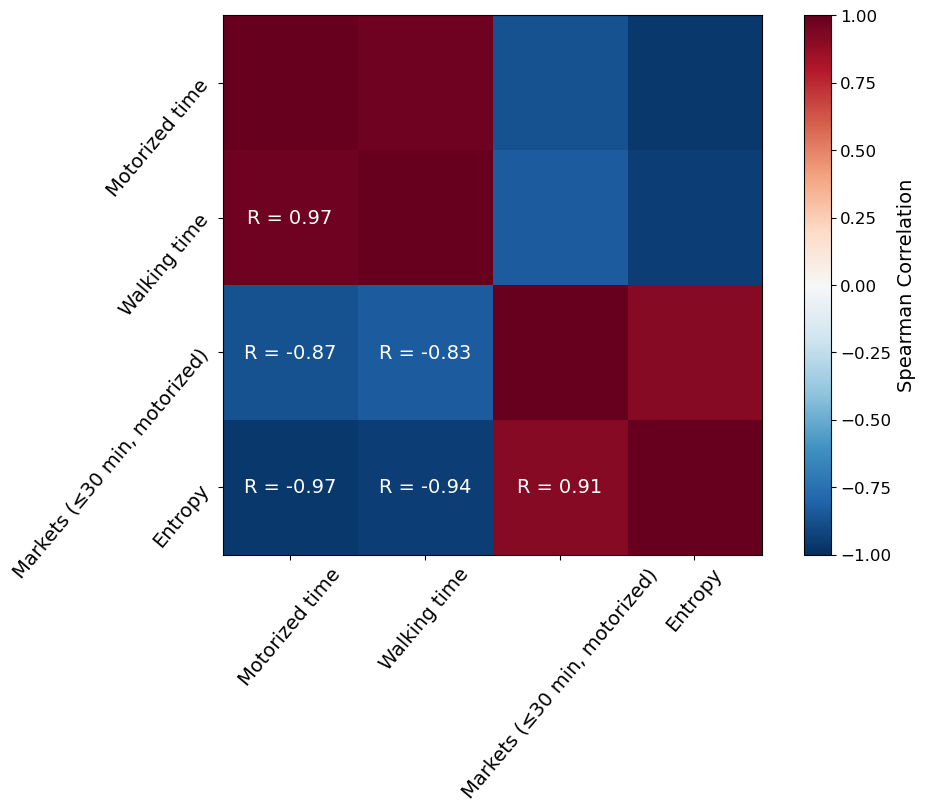

[[ 1.          0.82697873 -0.62113881 -0.44670694]
 [ 0.82697873  1.         -0.53787471 -0.34006459]
 [-0.62113881 -0.53787471  1.          0.32852411]
 [-0.44670694 -0.34006459  0.32852411  1.        ]]


In [28]:
fig, ax = plt.subplots(figsize=(10, 8), constrained_layout=True)  # Adjusted size for better visualization
label_ls = ['Motorized time', 'Walking time', 'Markets (≤30 min, motorized)', 'Entropy']
acc_ls = ['shortest_tt_median','shortest_tt_walk_median', 'entropy_median', 'pure_cumul_median']

corr_sp_median = country_avg_gdf[acc_ls].corr(method='spearman')

# Display the Spearman matrix
cax1 = ax.imshow(corr_sp_median, cmap='RdBu_r', vmin=-1, vmax=1)
# ax[1].set_title('Spearman Correlation', fontsize=14)

# Common colorbar
cbar = fig.colorbar(cax1, ax=ax, location='right', label='Spearman Correlation')

# Set colorbar label (title) font size
cbar.set_label('Spearman Correlation', fontsize=14)  

# Set tick label font size
cbar.ax.tick_params(labelsize=12)
# Turn off grid lines
ax.grid(False)

# Set x tick labels for the second matrix
ax.set_xticks(range(len(acc_ls)))
ax.set_xticklabels(label_ls, rotation=50, fontsize=14)
ax.set_yticks(range(len(acc_ls)))
ax.set_yticklabels(label_ls, rotation=50, fontsize=14)  # Hide y-axis labels for the second matrix

# Loop over data dimensions and create text annotations.
for i in range(len(label_ls)):
    for j in range(len(label_ls)):
        Rval = corr_sp_median.iloc[i, j]
        text_str = f'R = {round(Rval, 2)}'

        if i<=j:
            text_str = ''
        text = ax.text(j, i, text_str,
                       ha="center", va="center", color="white", fontsize = 14)

plt.savefig('./figs/median_correlation.pdf')
plt.show()
print(spearman_mat)

## BARPLOT OF TRAVEL-TIME WITH RURAL-URBAN

In [29]:
def build_barplot(thrs_values, acc_name):
    subregion_dict_old = {
                        "Northern Africa": [4, 40765, 145, 169, 6, 248, 268, 40760, 40762],
                        "Western Africa": [29, 42, 47, 66, 90, 94, 106, 105, 144, 155, 159, 181, 182, 217, 221, 243],
                        "Middle Africa": [8, 45, 49, 50, 59, 68, 76, 89, 214],
                        "Eastern Africa": [102, 43, 58, 70, 77, 79, 61013, 133, 150, 160, 205, 220, 226, 74, 253, 257],
                        "Southern Africa": [35, 235, 142, 152, 170, 172, 227, 270, 271]
                        }
    
    africa_borders_gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')
    
    subregion_dict = {}
    # print(africa_borders_gdf)
    for key in subregion_dict_old.keys():
        subregion_dict[key] = [africa_borders_gdf[africa_borders_gdf['ADM0_CODE'] == country]['ISO3'].values[0]
                               for country in subregion_dict_old[key]]

    total_pop = np.zeros(5)
    #convert numbers to iso3
    rur_urb_rast = rasterio.open('../shared_data/urban_rural_catchment_areas.tif')    
    avg_tt = np.zeros((5,5))
    pop_class_reg = np.zeros((5,5))
    population_counts = np.zeros((5, 5, len(thrs_values)-1))
    pop_africa = 0
    average_acc_rur = np.zeros(5)
    pop_class = np.zeros(5)
    
    for ind, subregion_name in enumerate(subregion_dict.keys()):
        print(subregion_name)
        subreg_countries = subregion_dict[subregion_name]
        
        for country_name in os.listdir('./computed_acc/'):
            country_path = os.path.join('./computed_acc/', country_name)
            if len(country_name) != 3:
                continue
            if os.path.isdir(country_path) and country_name.upper() in subreg_countries:
            
                acc_path = './computed_acc/'+country_name+'/'+acc_name
    
                acc_raster = rasterio.open(acc_path, 'r')
                
                acc_mat =  acc_raster.read()
                if len(acc_mat.shape) > 2:
                    acc_mat = acc_mat[0]
    
            else: continue
            # load the country shapefile
        
            country = gpd.read_file('../shared_data/africa_markets/borders/'+country_name+'.geojson')
        
            # load the cropped population raster
            for path in os.listdir('../shared_data/worldpop_rasters/'+country_name+'/'):
                if path.endswith('cropped.tif'):
                    pop_path = '../shared_data/worldpop_rasters/'+country_name+'/'+path
                    
                    break
                    
            # algn worldpop raster and accessibility raster
            country_rast = rasterio.open(pop_path, "r")
            acc_mat = align_extent_raster(pop_path, acc_raster)[0]
            pop_arr = country_rast.read()[0]
            country_rast.close()
            
            pop_arr_cop = np.where(pop_arr < 0, 0, pop_arr)
            pop_africa += np.nansum(pop_arr_cop)
            # Align the Worldpop and Rural-Urban rasters
            rur_urb_arr =  align_extent_raster(pop_path, rur_urb_rast)[0]
            rur_urb_arr = rur_urb_arr.astype(np.int16)  # Convert to signed int
            # print(rur_urb_arr.shape, pop_arr.shape, acc_mat.shape)
            rur_urb_arr[pop_arr < 0] = -999
        
            # Bild the 4-class rural-urban classification
            class_rur_urb_arr = build_class_rurub_arr(rur_urb_arr)
            class_rur_urb_arr[pop_arr < 0] = -9999  # Now it supports negative values
            
            acc_mat_cop = acc_mat.copy()
            acc_mat_cop[acc_mat_cop <0] = np.inf

            # set to infinity all accessible areas to crop the inaccessible areas according to friction surface
    
            total_pop[ind] += np.sum(pop_arr_cop)
            
            for rururb_ind in range(0,5):
                #computing avg shortest tt
                pop_arr_cop_2 = np.where(pop_arr < 0, 0, pop_arr)
                
                if rururb_ind != 0:
                    pop_arr_cop_2[class_rur_urb_arr != rururb_ind] = 0
                    
                avg_tt[ind,rururb_ind] += np.nansum(pop_arr_cop_2*acc_mat_cop)
                pop_class_reg[ind,rururb_ind] += np.nansum(pop_arr_cop_2)
                average_acc_rur[rururb_ind] += np.nansum(pop_arr_cop_2*acc_mat_cop)
                pop_class[rururb_ind] += np.nansum(pop_arr_cop_2)
                
                for i in range(1, len(thrs_values)):
                    thresh_up = thrs_values[i]
                    thresh_low = thrs_values[i-1]
                    if rururb_ind == 0:
                        pop_count = np.sum(pop_arr_cop[(thresh_low<=acc_mat_cop) & (acc_mat_cop <thresh_up)])
                    else:
                        pop_count = np.sum(pop_arr_cop[(thresh_low<=acc_mat_cop) & (acc_mat_cop <thresh_up) & (class_rur_urb_arr == rururb_ind)])
                    
                    population_counts[ind][rururb_ind][i-1] += pop_count
    
    avg_tt = avg_tt/pop_class_reg
    average_acc_rur = average_acc_rur/pop_class
    
    population_ratios = population_counts/1e6#*100/pop_africa #total_pop[:,None, None]
    print(average_acc_rur)
    print(pop_class)
    return(population_ratios)

In [33]:
def plot_barplot_no_countries(ax, fig, population_ratios, thrs_values, x_label, legend_pos = 'upper right', time = False):
    adapted_pop_ratios = np.sum(population_ratios, axis = 0)
    print(np.sum(population_ratios[:][1:][:])*1e6)
    subregion_dict_old = {
                        "Northern Africa": [4, 40765, 145, 169, 6, 248, 268, 40760, 40762],
                        "Western Africa": [29, 42, 47, 66, 90, 94, 106, 105, 144, 155, 159, 181, 182, 217, 221, 243],
                        "Middle Africa": [8, 45, 49, 50, 59, 68, 76, 89, 214],
                        "Eastern Africa": [102, 43, 58, 70, 77, 79, 61013, 133, 150, 160, 205, 220, 226, 74, 253, 257],
                        "Southern Africa": [35, 235, 142, 152, 170, 172, 227, 270, 271]
                        }
    
    africa_borders_gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')
    
    subregion_dict = {}
    # print(africa_borders_gdf)
    for key in subregion_dict_old.keys():
        subregion_dict[key] = [africa_borders_gdf[africa_borders_gdf['ADM0_CODE'] == country]['ISO3'].values[0]
                               for country in subregion_dict_old[key]]
    
    class_names_ls = ["Urban","Suburban", "Rural", "Hinterland"]
    paired_cmap = matplotlib.colormaps['Paired']
    paired_colors = [to_rgba(paired_cmap(i / 12)) for i in range(12)]
    class_colors = [paired_colors[3], paired_colors[2], paired_colors[0], paired_colors[1]]
    class_colors_dict = {i:j for i, j in zip(class_names_ls, class_colors)}
    if time == False:
        threshold_labels = [f'{thrs_values[i]}-{thrs_values[i+1]}' if not np.isinf(thrs_values[i+1]) else f'{thrs_values[i]}+' 
                            for i in range(len(thrs_values)-1)]
    else:
        thrs_val_h = [f'{int(i/60)}h' if i>=60 else f'{i} min' for i in thrs_values[:-1]]
        thrs_val_h.append(np.inf)

        threshold_labels = []

        for i in range(len(thrs_val_h)-1):
            if type(thrs_val_h[i+1])== str:
                if thrs_val_h[i][-3:] == thrs_val_h[i+1][-3:] and thrs_val_h[i][-3:] == 'min':
                    threshold_labels.append(f'{thrs_val_h[i][:2]}-{thrs_val_h[i+1]}')
                    
                elif thrs_val_h[i][-1] == thrs_val_h[i+1][-1] and thrs_val_h[i][-1] == 'h':
                    threshold_labels.append(f'{thrs_val_h[i][:2]}-{thrs_val_h[i+1]}')
                    
                else:
                    threshold_labels.append(f'{thrs_val_h[i]}-{thrs_val_h[i+1]}')

            else:
                    threshold_labels.append(f'{thrs_val_h[i]}+')

                    
            
        # threshold_labels = [f'{thrs_val_h[i]}-{thrs_val_h[i+1]}' if type(thrs_val_h[i+1]) == str else f'{thrs_val_h[i]}+' 
        #             for i in range(len(thrs_val_h)-1)]
    # Plotting
    # fig, ax = plt.subplots(figsize=(12, 8))
    bar_width = 0.2  # Width of each bar
    buffer = 0.02
    x_positions = np.linspace(0, len(thrs_values)+1 , len(thrs_values) - 1)  # X positions for each threshold
    
    for rururb_ind in range(1,5):
        idx = rururb_ind-1
        bar_positions = x_positions + idx * (bar_width+buffer)

        if rururb_ind == 1:
            ax.bar(bar_positions, adapted_pop_ratios[rururb_ind,:],  # Skip the first (0th) threshold (0-0 minutes)
                   width=bar_width,
                   color=class_colors[rururb_ind-1])
                   # label=subregion_name)
                    # hatch = subregion_patterns[subregion_name])
        else:
            ax.bar(bar_positions, adapted_pop_ratios[rururb_ind, :],  # Skip the first (0th) threshold (0-0 minutes)
                   width=bar_width,
                   color=class_colors[rururb_ind-1])
                   # label=subregion_name)
                    # hatch = subregion_patterns[subregion_name])    
    # Customize plot
    ax.set_xticks(x_positions + (bar_width+buffer) * (len(subregion_dict) - 1) / 2)
    ax.set_xticklabels(threshold_labels, fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    ax.set_xlabel(x_label, fontsize=25)
    
    ax.spines[['right', 'top']].set_visible(False)
    

In [32]:
thrs_values_moto = [0, 15, 60, 120, np.inf]
acc_name = 'shortest_moto_tt.tif'
population_ratios_moto = build_barplot(thrs_values_moto, acc_name)

acc_name = 'shortest_walk_tt.tif'
thrs_values_walk = [0, 30, 120, 300, np.inf]
population_ratios_walk = build_barplot(thrs_values_walk, acc_name)

acc_name = 'entropy_mod_4h_moto.tif'
thrs_values_entr = [0, 2, 4, 6, np.inf]
population_ratios_entr = build_barplot(thrs_values_entr, acc_name)

acc_name = 'acc_pure_cumul_moto.tif'
thrs_values_cum = [0, 1, 10, 50, np.inf]
population_ratios_cum = build_barplot(thrs_values_cum, acc_name)



Northern Africa
Western Africa
Middle Africa
Eastern Africa
Southern Africa
[ 43.67195289   4.11497187  23.65812856  63.23203537 245.11914167]
[1.33698023e+09 3.60106174e+08 6.57080632e+08 2.03566213e+08
 1.16227181e+08]
Northern Africa
Western Africa
Middle Africa
Eastern Africa
Southern Africa
[231.56279852  47.39394017 201.87815313 359.11343183 746.59341092]
[1.33698023e+09 3.60106174e+08 6.57080632e+08 2.03566213e+08
 1.16227181e+08]
Northern Africa
Western Africa
Middle Africa
Eastern Africa
Southern Africa
[2.80775835 4.120806   2.77910646 1.73222713 0.78527505]
[1.33698023e+09 3.60106174e+08 6.57080632e+08 2.03566213e+08
 1.16227181e+08]
Northern Africa
Western Africa
Middle Africa
Eastern Africa
Southern Africa
[ 41.5663302  122.06034484  16.94781068   1.13239132   2.16888347]
[1.33698023e+09 3.60106174e+08 6.57080632e+08 2.03566213e+08
 1.16227181e+08]


2181639568.780881
2181639576.15012
2183152089.88684
2183152064.115988


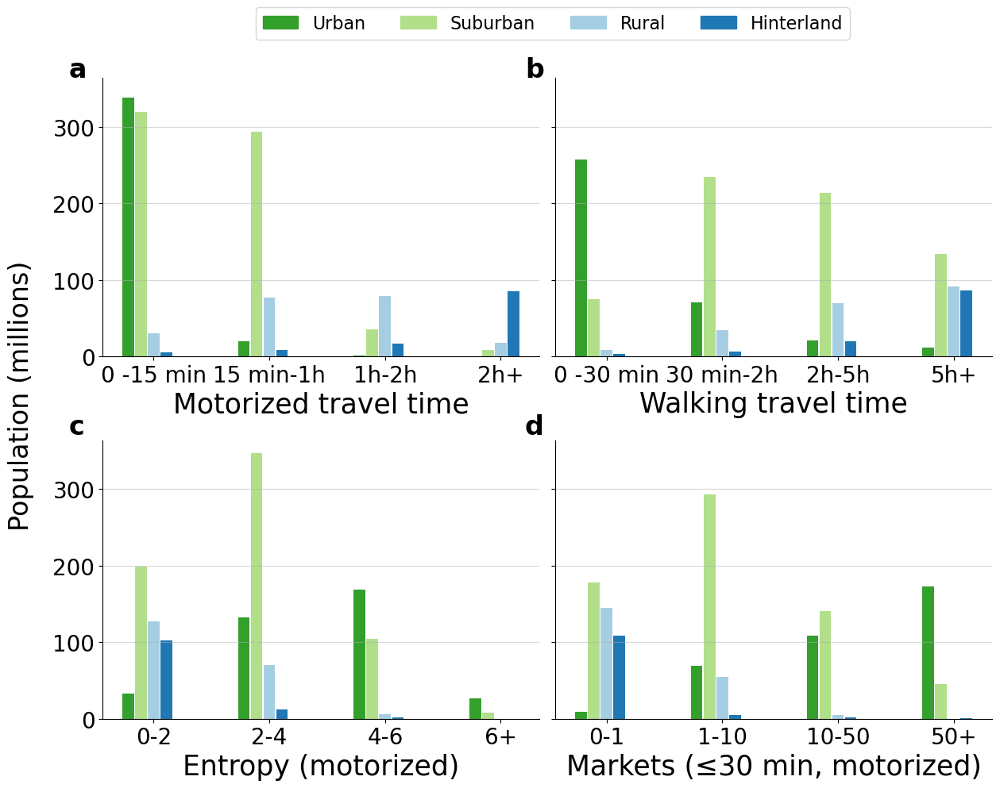

In [34]:
# %matplotlib widget
# %matplotlib notebook
    
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)

axes = axes.flatten()
for ax in axes:
    
    spines = ["top","right"]

    for s in spines:
        ax.spines[s].set_visible(False)
        ax.grid(axis='y', alpha=0.5)


plot_barplot_no_countries(axes[0], fig, population_ratios_moto, thrs_values_moto, 'Motorized travel time', time = True)

plot_barplot_no_countries(axes[1], fig,population_ratios_walk, thrs_values_walk, "Walking travel time", time = True)

plot_barplot_no_countries(axes[2], fig,population_ratios_entr, thrs_values_entr, "Entropy (motorized)", time = False)

plot_barplot_no_countries(axes[3], fig,population_ratios_cum, thrs_values_cum, "Markets (≤30 min, motorized)", time = False)

plt.tight_layout()
plt.subplots_adjust(right=0.92, 
                    left = 0.12, 
                    top = 0.9,      # the top of the subplots of the figure
                    hspace = 0.3)

# Common y-axis label
fig.text(0.035, 0.5, 'Population (millions)', va='center', rotation='vertical', fontsize=24)
# Create color legend
fig.text(0.09, 0.91, 'a', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.5, 0.91, 'b', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.09, 0.46, 'c', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.5, 0.46, 'd', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')

class_names_ls = ["Urban","Suburban", "Rural", "Hinterland"]
paired_cmap = matplotlib.colormaps['Paired']
paired_colors = [to_rgba(paired_cmap(i / 12)) for i in range(12)]
class_colors = [paired_colors[3], paired_colors[2], paired_colors[0], paired_colors[1]]

color_legend_handles = [
    mpatches.Patch(color=class_colors[i], label=class_names_ls[i])
    for i in range(4)]
# Add legends
legend1 = fig.legend(ncols = 4,
    handles=color_legend_handles, 
    fontsize=16, 
    bbox_to_anchor=(0.8, 1)
)
# plt.savefig('./figs/rurub_barplots/barplots_no_regions.pdf')
plt.show()

## Sensitivity Analysis on Ethiopia

In [35]:
def weighted_percentile(data, weights, perc):
    """
    Compute the weighted percentile of `data` with `weights`.

    Parameters:
        data (array-like): Data array (can contain NaNs).
        weights (array-like): Corresponding weights (must be same length as data).
        perc (float): Desired percentile in [0, 1].

    Returns:
        float: The weighted percentile value.
    """
    data = np.asarray(data)
    weights = np.asarray(weights)
    
    # Remove NaNs in data or weights
    mask = ~np.isnan(data) & ~np.isnan(weights)
    data = data[mask]
    weights = weights[mask]

    if len(data) == 0:
        return np.nan

    # Sort data and weights
    ix = np.argsort(data)
    data = data[ix]
    weights = weights[ix]

    # Compute CDF
    cdf = (np.cumsum(weights) - 0.5 * weights) / np.sum(weights)

    # Interpolate
    return np.interp(perc, cdf, data)


# function to compute the weighted mean
def weighted_mean(data, weights):
    return np.nansum(data * weights) / np.nansum(weights)

def weighted_median(values, weights):
    i = np.argsort(values)[::]
    c = np.nancumsum(weights[i])
    if np.isinf(c[-1]):
        print(0.5 * c[-1])
        raise
    return values[i[np.searchsorted(c, 0.5 * c[-1])]]

In [36]:
mean_cumul = []
percentile_ls = []
min_ls = []
max_ls = []
thrs_ls = []
mode_ls = []
pop_mean_ls = []
weighted_percentile_ls = []
ci_upper_ls = []
ci_lower_ls = []
weighted_median_ls = []
pop_std_ls = []
#Load WorldPop to get extent and Transform(?)
for path in os.listdir(f"../shared_data/worldpop_rasters/eth"):
    if path.endswith('cropped.tif'):
        chosen_path = path
with rasterio.open(f"../shared_data/worldpop_rasters/eth"+\
                   "/"+chosen_path, "r") as src:
    wpp_arr = src.read()
    wpp_arr = np.where(wpp_arr < 0, 0, wpp_arr)
for filename in os.listdir('./computed_acc/sensitivity/79'):
    threshold = ''
    for i in filename:
        if i.isnumeric():
            threshold += i  
        if i == '.':
            break
    threshold = int(threshold)#/100
    thrs_ls.append(threshold)
    arr_path = os.path.join('./computed_acc/sensitivity/79/', filename)
    print(threshold)
    with open(arr_path, 'rb') as f:
        arr = pickle.load(f)
        arr =  arr.toarray()
    
    data = arr.flatten()
    weights = wpp_arr.flatten()
    p = weights/np.nansum(weights)
    p[np.isnan(p)] = 0

    pp_arr = wpp_arr*arr
    pp_arr[np.isnan(pp_arr)] = 0
    pop_mean = np.nansum(pp_arr)/np.nansum(wpp_arr)
    pop_std = np.sqrt(np.nansum(wpp_arr*((arr-pop_mean)**2))/np.nansum(wpp_arr))
    pop_mean_ls.append(pop_mean)
    mean = np.nanmean(arr)
    min_ls.append(np.nanmin(arr))
    max_ls.append(np.nanmax(arr))
    mean_cumul.append(mean)   
    percentile = np.nanpercentile(arr, 95)
    percentile_ls.append(percentile)
    mode_val = np.nanmedian(arr.flatten())
    mode_ls.append(mode_val)
    weighted_percentile_ls.append(weighted_percentile(arr.flatten(), wpp_arr.flatten(), 0.95))
    weighted_median_ls.append(weighted_median(arr.flatten(), wpp_arr.flatten()))
    pop_std_ls.append(pop_std)
    
    
thrs_ls = np.array(thrs_ls) 
mean_cumul = np.array(mean_cumul)[np.argsort(thrs_ls)]
weighted_median_ls = np.array(weighted_median_ls)[np.argsort(thrs_ls)]
pop_std_ls = np.array(pop_std_ls)[np.argsort(thrs_ls)]
# ci_lower_ls = np.array(ci_lower_ls)[np.argsort(thrs_ls)]
# ci_upper_ls = np.array(ci_upper_ls)[np.argsort(thrs_ls)]

pop_mean_ls = np.array(pop_mean_ls)[np.argsort(thrs_ls)]
# R_ls= np.array(R_ls)[np.argsort(thrs_ls)]
weighted_percentile_ls = np.array(weighted_percentile_ls)[np.argsort(thrs_ls)]
percentile_ls = np.array(percentile_ls)[np.argsort(thrs_ls)]
max_ls = np.array(max_ls)[np.argsort(thrs_ls)]
min_ls = np.array(min_ls)[np.argsort(thrs_ls)]
mode_ls = np.array(mode_ls)[np.argsort(thrs_ls)]
thrs_ls = np.sort(thrs_ls)

# fig, ax = plt.subplots()
# ax.hist(arr.flatten(), bins = 100)
# plt.show()

75
165
130
20
65
175
120
30
155
45
10
100
190
80
180
90
145
55
110
50
140
115
95
185
85
195
40
150
105
15
170
60
35
125
160
70
5
25
135
200


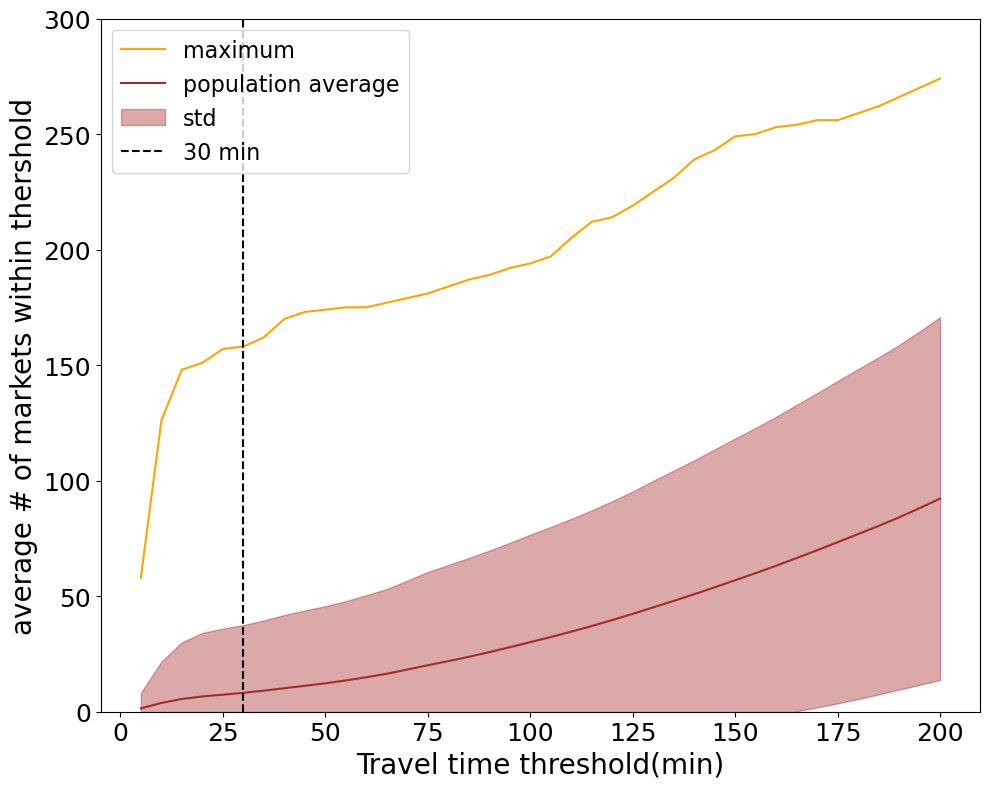

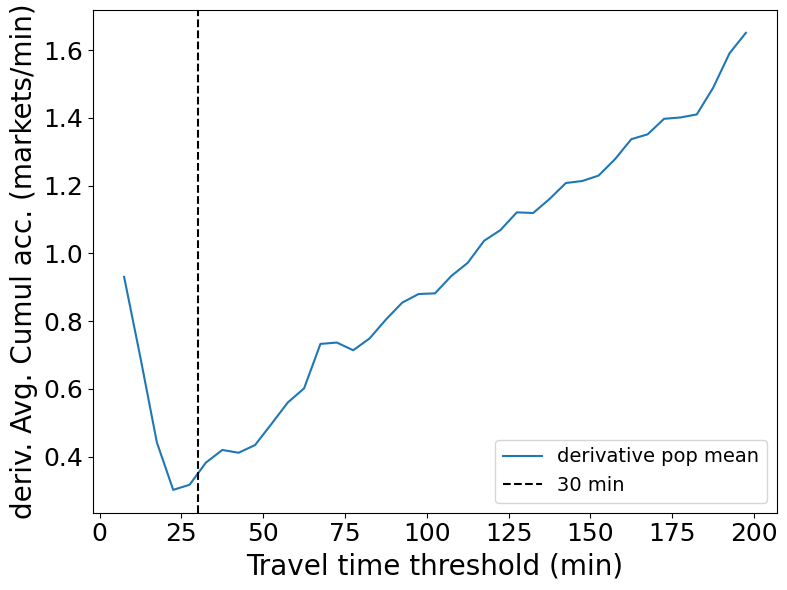

In [37]:
# Sort mean_cumul based on the sorted order of thrs_ls
mean_cumul_deriv = np.array([mean_cumul[i+1] - mean_cumul[i] for i in range(len(mean_cumul)-1)])/2.5
pop_mean_cumul_deriv = np.array([pop_mean_ls[i+1] - pop_mean_ls[i] for i in range(len(pop_mean_ls)-1)])/2.5

p_mean_w_std = pop_mean_ls+pop_std_ls
p_mean_m_std = pop_mean_ls-pop_std_ls

deriv_std =  np.sqrt(pop_std_ls[1:]**2 + pop_std_ls[:-1]**2)/(thrs_ls[1:] - thrs_ls[:-1])

thrs_ls_deriv = thrs_ls+2.5
thrs_ls_deriv = thrs_ls_deriv[:-1]

# mean_cumul_deriv_R = np.array([(mean_cumul[i+1] - mean_cumul[i])/(R_ls[i+1] - R_ls[i]) for i in range(len(mean_cumul)-1)])
# pop_mean_cumul_deriv_R = np.array([(pop_mean_ls[i+1] - pop_mean_ls[i])/(R_ls[i+1] - R_ls[i]) for i in range(len(pop_mean_ls)-1)])

# thrs_ls_deriv_R = [(R_ls[i+1] - R_ls[i])/2 + R_ls[i] for i in range(len(mean_cumul)-1)]

colors = {
    "mean_cumul": "blue",
    "percentile_ls": "orange",
    "min_ls": "green",
    "max_ls": "red",
    "mode_ls": "purple",
    "pop_mean_ls": "brown",
    "weighted_percentile_ls": "yellow"
}

fig, ax = plt.subplots(figsize = (10,8))

# ax.plot(thrs_ls, mean_cumul, label='average', color=colors["mean_cumul"])
# ax.plot(thrs_ls, percentile_ls, label='95th percentile', color=colors["percentile_ls"])
# ax.plot(thrs_ls, min_ls, label='minimum', color=colors["min_ls"])
ax.plot(thrs_ls, max_ls, label='maximum', color=colors["percentile_ls"])
# ax.plot(thrs_ls, weighted_median_ls, label='weighted median', color=colors["mode_ls"])
ax.plot(thrs_ls, pop_mean_ls, label='population average', color=colors["pop_mean_ls"])
# ax.plot(thrs_ls, weighted_percentile_ls, label='pop weighted 95 percentile', color=colors["weighted_percentile_ls"])

ax.fill_between(thrs_ls,pop_mean_ls+pop_std_ls, pop_mean_ls-pop_std_ls, alpha=0.4, color=colors["pop_mean_ls"], label = 'std')#step="pre"

# ax.axvline(0.077, 0, 180, ls = '--', c = 'black', label = r'$\beta$ = 0.077')
ax.axvline(30, 0, 180, ls = '--', c = 'black', label = r'30 min')

# ax.set_yscale('log')
ax.grid(False)
# inset_ax.grid(False)

# ax.legend(bbox_to_anchor = (0.1, 0.7), fontsize = 16)
ax.tick_params(axis='both', labelsize=18)
ax.legend(fontsize = 16, loc = 'upper left')
ax.set_ylim(0, 300)
ax.set_xlabel('Travel time threshold(min)', fontsize = 20)
ax.set_ylabel('average # of markets within thershold', fontsize = 20)
# ax.set_xlabel(r'Sensitivity $\beta$ $(\text{min}^{-1})$', fontsize = 20)
# ax.set_ylabel('Cumulative Acc', fontsize = 20)
plt.savefig('./figs/sensitiv_30min.pdf', bbox_inches='tight')

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize = (8, 6))
# ax.plot(thrs_ls_deriv, mean_cumul_deriv, label = 'derivative mean')
ax.plot(thrs_ls_deriv, pop_mean_cumul_deriv, label = 'derivative pop mean')

# ax.fill_between(thrs_ls_deriv,pop_mean_cumul_deriv+deriv_std, pop_mean_cumul_deriv-deriv_std, alpha=0.4, color=colors["pop_mean_ls"], label = 'std')#step="pre"

ax.axvline(30, 0, 180, ls = '--', c = 'black', label = r'30 min')
ax.legend(fontsize=14)

ax.set_xlabel('Travel time threshold (min)', fontsize = 20)
# ax.set_xlabel(r'Sensitivity $\beta$', fontsize = 20)
ax.set_ylabel(r'deriv. Avg. Cumul acc. (markets/min)', fontsize = 20)
ax.grid(False)
ax.tick_params(axis='both', labelsize=18)
plt.tight_layout()
plt.savefig('./figs/sensitiv_30min_deriv.pdf', bbox_inches='tight')
plt.show()
# Define a list of colors


## Relative Wealth Index

In [38]:

# code from: https://stackoverflow.com/questions/75698393/create-a-raster-from-points-gpd-geodataframe-object-in-python-3-6

def rasterize_points(points: np.ndarray, res_x: Union[int, float], 
                     res_y: Union[int, float], bbox: tuple, no_data_val: float
                     ) -> np.ndarray:
    """Rasterize points into a grid with a given resolution.

    Args:
        points (np.ndarray): Points to rasterize, with columns (x, y, value) (for
            geographic coordinates, use (lon, lat, value))
        res (Union[int, float]): Resolution of the grid
        bbox (tuple): Bounding box of the grid

    Returns:
        np.ndarray: Rasterized grid
    """
    width = int((bbox[2] - bbox[0]) / res_x)
    height = int((bbox[3] - bbox[1]) / res_y)
    rast = np.ones((height, width), dtype=np.float32)*no_data_val
    count_array = np.zeros_like(rast)

    for x, y, value in points:
        # print(x, y)
        col = int((x - bbox[0]) / res_x)
        row = int((bbox[3] - y) / res_y)
        try:
            if count_array[row, col] == 0:
                rast[row, col] = value
                count_array[row, col] = 1
            else:
                rast[row, col] += value
                count_array[row, col] += 1
        except:
            print(x, y, row, col)

    # Avoid division by zero
    count_array[count_array == 0] = 1

    # Calculate the average
    rast = rast / count_array
    
    rast[rast==no_data_val] = np.nan

    return rast


def fill(data, invalid=None):
    """
    Replace the value of invalid 'data' cells (indicated by 'invalid') 
    by the value of the nearest valid data cell

    Input:
        data:    numpy array of any dimension
        invalid: a binary array of same shape as 'data'. True cells set where data
                 value should be replaced.
                 If None (default), use: invalid  = np.isnan(data)

    Output: 
        Return a filled array. 
    """

    if invalid is None: invalid = np.isnan(data)

    ind = nd.distance_transform_edt(invalid, return_distances=False, return_indices=True)
    return data[tuple(ind)]

In [39]:

gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')
no_iso3 = []
base_path = '../shared_data/rwi/rwi_csv/'
for row in range(len(gdf)):
    try:
        iso3 = gdf.iloc[row]['ISO3']
        fname = f'{iso3}_relative_wealth_index.csv'
        iso3 = iso3.lower()

    except:
        continue

    if iso3 == None:
        country_nm = gdf.iloc[row]['ADM0_NAME']
        no_iso3.append(country_nm)
        continue
    try:
         # Read the Relative Wealth Index DF
        rwi_df = pd.read_csv(base_path+fname)
    except FileNotFoundError:
        print(iso3)
        continue
    print(iso3)
    rwi_df['geometry'] = [Point(xy) for xy in zip(rwi_df.longitude, rwi_df.latitude)]
    rwi_gdf = gpd.GeoDataFrame(rwi_df, geometry = 'geometry')
    rwi_gdf.drop(['latitude', 'longitude'], inplace = True, axis = 1)
    rwi_gdf = rwi_gdf.set_crs(crs = 'EPSG:4326')
    buff = 0.03
    bbox = (rwi_df.longitude.min(), rwi_df.latitude.min()-buff, rwi_df.longitude.max()+buff, rwi_df.latitude.max())
    # Taking the resolution to rasterise the rwi points

    lat_arr = np.array(rwi_df.latitude)
    lon_arr = np.array(rwi_df.longitude)
    
    lat_arr = lat_arr-lat_arr[0]
    lon_arr = lon_arr-lon_arr[0]
    
    step_lat = lat_arr[lat_arr>0].min()
    step_lon = lon_arr[lon_arr>0].min()
    no_data_val = np.nan
    rast = rasterize_points(points = np.array(rwi_df[['longitude', 'latitude','rwi']]),
                            res_x = step_lon, res_y=step_lat, bbox = bbox, no_data_val = no_data_val)
    #save the raster to a file 
    minx, miny, maxx, maxy = bbox
    transform = rasterio.transform.from_bounds(minx, miny, maxx, maxy, rast.shape[1], rast.shape[0])
    
    if not os.path.isdir('../shared_data/rwi/rwi_tif'):
        os.makedirs('../shared_data/rwi/rwi_tif')
    
    new_dataset = rasterio.open(f'../shared_data/rwi/rwi_tif/{iso3}_relative_wealth_index.tif',
                                'w', driver='GTiff',
                                height = rast.shape[0], width = rast.shape[1],
                                count=1, dtype=str(rast.dtype),
                                crs='EPSG:4326',
                                transform=transform)
    new_dataset.nodata = np.nan
    new_dataset.write(rast, 1)
    new_dataset.close()


    with rasterio.open(f'../shared_data/rwi/rwi_tif/{iso3}_relative_wealth_index.tif') as src:

        raster1 = src.read(1)  # Read the first band
        src_transform = src.transform
        
    for path in os.listdir(f"../shared_data/worldpop_rasters/{iso3}"):
        if path.endswith('cropped.tif'):
            chosen_path = path
            break
    with rasterio.open(f"../shared_data/worldpop_rasters/{iso3}"+\
                   "/"+chosen_path, "r") as src:
        new_shape = (src.height, src.width)  # (N3, N4)
        new_transform = src.transform  # New bounds
        worldpop_arr = src.read()[0]
        crs = src.crs


    # Create an empty array for the resampled data
    resampled_raster1 = np.empty(new_shape, dtype=raster1.dtype)
    resampled_raster1[:] = np.nan
    # Perform the resampling
    with rasterio.open(f'../shared_data/rwi/rwi_tif/{iso3}_relative_wealth_index.tif') as src:
        rasterio.warp.reproject(
            source=raster1,
            destination=resampled_raster1,
            src_transform=src_transform,
            dst_transform=new_transform,
            src_crs=src.crs,
            dst_crs=crs,
            resampling=Resampling.average,
            src_nodata = np.nan,
            dst_nodata = np.nan
        )
    
    filled_rast = fill(resampled_raster1)
    filled_rast[worldpop_arr<0] = np.nan
    # Save the resampled raster
    with rasterio.open(
        f'../shared_data/rwi/rwi_tif/{iso3}_relative_wealth_index.tif',
        "w",
        driver="GTiff",
        height=new_shape[0],
        width=new_shape[1],
        count=1,
        dtype=resampled_raster1.dtype,
        crs=crs,
        transform=new_transform,
        nodata = np.nan
    ) as dst:
        dst.write(filled_rast, 1)

    # new_dataset = rasterio.open(f'../shared_data/rwi/rwi_tif/{iso3}_relative_wealth_index.tif',
    #                             'w', driver='GTiff',
    #                             height = rast_transformed.shape[0], width = rast_transformed.shape[1],
    #                             count=1, dtype=str(rast_transformed.dtype),
    #                             crs=crs,
    #                             transform=transform)
    
    # new_dataset.write(rast_transformed, 1)
    # new_dataset.close()
print('countries without iso3:', no_iso3)

sdn
ago
ben
bwa
bfa
cmr
cpv
caf
tcd
com
cog
civ
cod
dji
ssd
gnq
eri
eth
gab
gmb
gha
gnb
gin
ken
lso
lbr
mdg
mwi
mli
mrt
mus
moz
nam
ner
nga
sen
syc
sle
som
zaf
swz
tgo
uga
tza
zmb
zwe
dza
bdi
lby
mar
rwa
stp
tun
esh
egy
countries without iso3: []


In [381]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = np.nanargmin((np.abs(array - value)))
    return idx

country_num_ls = os.listdir('./computed_acc')

moto_perc_ls = []
walk_perc_ls = []
entr_perc_ls = []
cumul_perc_ls = []

# Second pass: plot the data
for country_num in country_num_ls:
    print(country_num)
    if len(country_num)!=3:
        continue
    rwi_path = f'../shared_data/rwi/rwi_tif/{country_num}_relative_wealth_index.tif'
    
    # Load the raster data
    try:
        with rasterio.open(rwi_path, "r") as f:
            rwi_arr = f.read()[0]
        rwi_flat = rwi_arr.flatten()
    except:
        continue
        
    # Align accessibility raster with rwi
    acc_path = f'./computed_acc/{country_num}/shortest_moto_tt.tif'
    with rasterio.open(acc_path, 'r') as f:
            
        acc_moto = align_extent_raster(rwi_path, f)[0]
        
    acc_path = f'./computed_acc/{country_num}/shortest_walk_tt.tif'
    with rasterio.open(acc_path, 'r') as f:
            
        acc_walk = align_extent_raster(rwi_path, f)[0]
        
    acc_path = f'./computed_acc/{country_num}/entropy_mod_4h_moto.tif'
    with rasterio.open(acc_path, 'r') as f:
            
        entropy = align_extent_raster(rwi_path, f)[0]
        
    acc_path = f'./computed_acc/{country_num}/acc_pure_cumul_moto.tif'
    with rasterio.open(acc_path, 'r') as f:
            
        cumul = align_extent_raster(rwi_path, f)[0]
        
    # Load WorldPop to get extent and transform
    for path in os.listdir(f"../shared_data/worldpop_rasters/{country_num}"):
        if path.endswith('cropped.tif'):
            chosen_path = path
    wpp_path = f"../shared_data/worldpop_rasters/{country_num}/{chosen_path}"
    with rasterio.open(wpp_path, "r") as src:
        worldpop_arr = src.read()[0]
        
        if worldpop_arr.shape != cumul.shape:
            raise('Shape mismatch between pop and acc!')
            
        worldpop_arr = worldpop_arr.flatten()
        
        worldpop_arr = np.where(worldpop_arr<0, 0, worldpop_arr)
        worldpop_arr = np.where(np.isnan(cumul.flatten()), 0, worldpop_arr)

    
    percentile = weighted_percentile(rwi_flat, worldpop_arr, 0.2)
    idx = np.argwhere(rwi_flat == percentile)
    
    if type(idx) == np.ndarray:
        if len(idx) == 0: #the percentile is between two values in the rwi
            idx = find_nearest(rwi_flat, percentile)

        
    unrav_ind = np.unravel_index(idx, cumul.shape)
    
#     
    
    moto_perc_ls.append(np.nanmean(acc_moto[unrav_ind]))

    walk_perc_ls.append(np.nanmean(acc_walk[unrav_ind]))

    entr_perc_ls.append(np.nanmean(entropy[unrav_ind]))

    cumul_perc_ls.append(np.nanmean(cumul[unrav_ind]))

    
    

syc
gmb
gnq
ssd
caf
mar
gha
gnb
ago
zwe
rwa
.DS_Store
ner
sdn
tun
lby
eri
som
sle
mwi
sensitivity
bdi
cog
moz
tgo
mli
civ
stp
dza
tcd
mdg
bwa
egy
cmr
gab
esh
bfa
ben
uga
dji
cpv
mus
eth
nam
nga
sen
mrt
lbr
tza
ken
zaf
cod
swz
gin
lso
com
zmb


/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_88985/2798127719.py:79: RuntimeWarning: Mean of empty slice
  moto_perc_ls.append(np.nanmean(acc_moto[unrav_ind]))
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_88985/2798127719.py:81: RuntimeWarning: Mean of empty slice
  walk_perc_ls.append(np.nanmean(acc_walk[unrav_ind]))


103.05996841946406 420.97669830321854 1.9453597 6.393809626955747


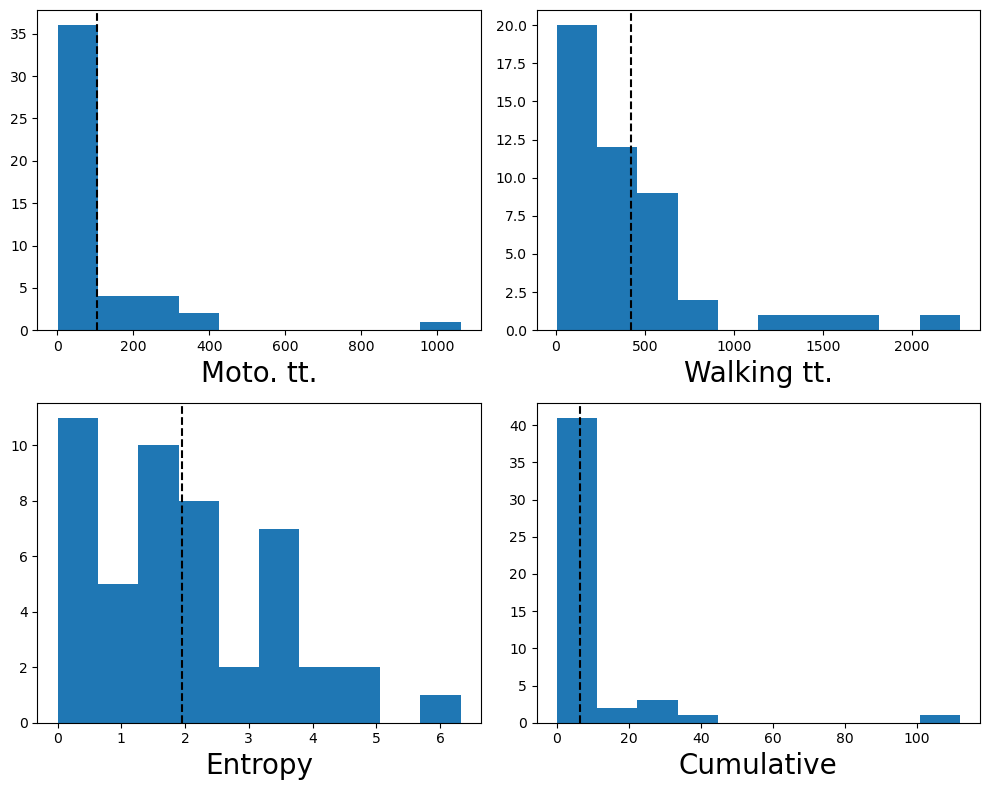

In [325]:
fig, ax = plt.subplots(2, 2, figsize = (10, 8))
ax[0,0].hist(np.array(moto_perc_ls))
ax[0,0].set_xlabel('Moto. tt.', fontsize = 20)
ax[0,0].axvline(np.nanmean(np.array(moto_perc_ls)), linestyle = '--', color = 'black')

ax[0,1].hist(np.array(walk_perc_ls))
ax[0,1].set_xlabel('Walking tt.', fontsize = 20)
ax[0,1].axvline(np.nanmean(np.array(walk_perc_ls)), linestyle = '--', color = 'black')


ax[1,0].hist(np.array(entr_perc_ls))
ax[1,0].set_xlabel('Entropy', fontsize = 20)
ax[1,0].axvline(np.nanmean(np.array(entr_perc_ls)), linestyle = '--', color = 'black')


ax[1,1].hist(np.array(cumul_perc_ls))
ax[1,1].set_xlabel('Cumulative', fontsize = 20)
ax[1,1].axvline(np.nanmean(np.array(cumul_perc_ls)), linestyle = '--', color = 'black')

plt.tight_layout()

print(np.nanmean(np.array(moto_perc_ls)), 
      np.nanmean(np.array(walk_perc_ls)), 
      np.nanmean(np.array(entr_perc_ls)),
     np.nanmean(np.array(cumul_perc_ls)))

#138.74674383853667 526.820485621192 1.4748402 2.009149041546793   ---- 0.2
#46.19740813866766 266.0841142044107 1.8279765844345093 0.0    ---- 0.1 


## Correlations between RWI and MKT Access

In [2]:

#{6: 'Sudan', 8: 'Angola', 29: 'Benin', 35: 'Botswana', 42: 'Burkina Faso', 45: 'Cameroon', 47: 'Cape Verde', 49: 'Central African Republic',
#50: 'Chad', 58: 'Comoros', 59: 'Congo', 66: "Côte d'Ivoire", 68: 'Democratic Republic of the Congo', 70: 'Djibouti', 74: 'South Sudan',
#76: 'Equatorial Guinea', 77: 'Eritrea', 79: 'Ethiopia', 89: 'Gabon', 90: 'Gambia', 94: 'Ghana', 105: 'Guinea-Bissau', 106: 'Guinea', 133: 'Kenya',
#142: 'Lesotho', 144: 'Liberia', 150: 'Madagascar', 152: 'Malawi', 155: 'Mali', 159: 'Mauritania', 160: 'Mauritius', 170: 'Mozambique', 172: 'Namibia',
#181: 'Niger', 182: 'Nigeria', 217: 'Senegal', 220: 'Seychelles', 221: 'Sierra Leone', 226: 'Somalia', 227: 'South Africa', 235: 'Swaziland', 243: 'Togo',
#253: 'Uganda', 257: 'United Republic of Tanzania', 270: 'Zambia', 271: 'Zimbabwe', 4: 'Algeria', 43: 'Burundi', 102: 'Abyei', 145: 'Libya', 169: 'Morocco',
#205: 'Rwanda', 214: 'Sao Tome and Principe', 248: 'Tunisia', 268: 'Western Sahara', 40760: "Hala'ib triangle", 40762: "Ma'tan al-Sarra", 40765: 'Egypt',
#61013: 'Ilemi triangle'}

def get_geodata(adm0, admin2: bool=False):
    """
    creates a dataframe with the wfp geometries
    :param adm0: gets the country code as set from wfp, e.g., 79 for Ethiopia, and 182 for Nigeria
    :param admin2: gets both admin2 and admin1 data; default is False
    :return: a dataframe with the wfp geometries
    """

    # for admin1
    req = requests.get(f"https://api.vam.wfp.org/geodata/GetGeoAdmins?adm0={adm0}&admcode={adm0}", headers = {'User-agent': f'your bot {adm0}'})
    req.raise_for_status()  # raises exception when not a 2xx response
    # if req.status_code != 204:
    #     return req.json()
    # sleep(5)

    geo_df = gpd.GeoDataFrame.from_features(req.json()['features'])

    # for admin2
    if admin2==True:
        # rename columns
        geo_df = geo_df.rename(columns={'geometry': 'geometry_adm1', "Code": "Code_adm1", "Name": "Name_adm1"})
        #create an empty df to use
        all_adm2 = pd.DataFrame(columns=['geometry', 'Code', 'Name', 'Code_adm1'])
        for code in geo_df.Code_adm1:
            # print(code)
            req_adm2 = gpd.GeoDataFrame.from_features(requests.get(f"https://api.vam.wfp.org/geodata/GetGeoAdmins?adm0={adm0}&admcode={code}").json()["features"])
            req_adm2['Code_adm1'] = code
            all_adm2 = pd.concat([req_adm2, all_adm2])
            sleep(0.5)
        #merge
        geo_df = pd.merge(geo_df, all_adm2, on='Code_adm1')
    
    geo_df.set_crs('EPSG:4326', inplace = True)
    return geo_df


In [3]:
country_num_ls = os.listdir('./computed_acc')
global_gdf = gpd.GeoDataFrame()
# south sudan, sudan and senegal

In [8]:
# Run this cell 3 times since sometimes the request fails. 
# Run until request_fails == ['uga', 'gin'] 

# List of countries
# Set up a single plot
wrong_numbers = {74:70001, 6: 40764, 217:278}
cmap = matplotlib.colormaps['RdBu_r']
# norm = BoundaryNorm(percentile_bins, cmap.N)
request_fails = []
africa_gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')

# Second pass: plot the data
for country_iso3 in country_num_ls:
    # print(country_iso3)

    try:
        country_num = int(africa_gdf.loc[africa_gdf['ISO3'] == country_iso3.upper()]['ADM0_CODE'].values[0])
    except:
        continue        
    rwi_path = f'../shared_data/rwi/rwi_tif/{country_iso3}_relative_wealth_index.tif'
    
    # Load the raster data
    try:
        with rasterio.open(rwi_path, "r") as rwi_rast:
            rwi_arr = rwi_rast.read()[0]
        
    except Exception as e:
#         print(f"Error processing country {country_iso3}: {e}")
        continue
        
    # print('loaded rwi')
    # Load WorldPop to get extent and transform
    for path in os.listdir(f"../shared_data/worldpop_rasters/{country_iso3}"):
        if path.endswith('cropped.tif'):
            chosen_path = path
    wpp_path = f"../shared_data/worldpop_rasters/{country_iso3}/{chosen_path}"
    with rasterio.open(wpp_path, "r") as src:
        transform = src.transform
        worldpop_arr = src.read()[0]
        worldpop_arr = np.where(worldpop_arr<0, 0, worldpop_arr)
        
    # print('loaded population')
    en_path = f'./computed_acc/{country_iso3}/entropy_mod_4h_moto.tif'
    shortest_tt_path = f'./computed_acc/{country_iso3}/shortest_moto_tt.tif'
    shortest_walinkg_tt_path = f'./computed_acc/{country_iso3}/shortest_walk_tt.tif'
    acc_path_pure_cumul = f'./computed_acc/{country_iso3}/acc_pure_cumul_moto.tif'
    
    with rasterio.open(en_path, 'r') as f:
        entropy = align_extent_raster(wpp_path, f)[0]

    # print('loaded entropy')

    with rasterio.open(shortest_tt_path, 'r') as f:
        shortest_tt = align_extent_raster(wpp_path, f)[0]


    with rasterio.open(shortest_walinkg_tt_path, 'r') as f:
        shortest_walking_tt = align_extent_raster(wpp_path, f)[0]

    # print('loaded shortest tt.')

    with rasterio.open(acc_path_pure_cumul, 'r') as f:
        acc_pure_cumul = align_extent_raster(wpp_path, f)[0]

    # Load country boundaries
    try:
        if country_num in wrong_numbers.keys():
            correct_num = wrong_numbers[country_num]
        else:
            correct_num = country_num
        country_adm_gdf = get_geodata(correct_num, True)
        country_adm_gdf['country_num'] = np.ones(len(country_adm_gdf))*country_num
        
    except Exception as e:
        print(e)
        request_fails.append(country_iso3)
        continue

    rwi_ls = []
    populations = []
    # acc_cumul_admin = []
    short_tt_admin = []
    entropy_adm = []
    pure_cumul_adm = []
    RI_admin = []
    walk_tt_adm = []
    
    # Read and process rural urban raster
    rur_urb_rast = rasterio.open('../shared_data/urban_rural_catchment_areas.tif')
    # Align the Worldpop and Rural-Urban rasters
    rur_urb_arr = align_extent_raster(wpp_path, rur_urb_rast)[0]

    class_rur_urb_arr = build_class_rurub_arr(rur_urb_arr)
    for i, poly in enumerate(country_adm_gdf['geometry']):
        
        clipped_rwi, _, _ =  raster_geometry_mask(rwi_rast, [mapping(poly)], 
                                                crop=False, invert = True, all_touched = True)
        
        true_points = ~(np.ones_like(clipped_rwi)&clipped_rwi)
        # take the smallest points and use them as the top left of your crop
        top_left = true_points.min(axis=0)
        # take the largest points and use them as the bottom right of your crop
        bottom_right = true_points.max(axis=0)

        rwi_arr_ma = np.copy(rwi_arr)
        rwi_arr_ma[true_points] = 0

        RI_masked = np.copy(class_rur_urb_arr)
        RI_masked[true_points] = 0
        RI_masked[RI_masked<0] = 0
    
        # access_mat_cumul_masked = np.copy(access_mat_cumul)
        # access_mat_cumul_masked[true_points] = 0
    
        pure_cumul_masked = np.copy(acc_pure_cumul)
        pure_cumul_masked[true_points] = 0
    
        shortest_tt_rast_masked = np.copy(shortest_tt)
        shortest_tt_rast_masked[true_points] = 0
        
        shortest_tt_walking_masked = np.copy(shortest_walking_tt)
        shortest_tt_walking_masked[true_points] = 0
            
        entropy_masked = np.copy(entropy)
        entropy_masked[true_points] = 0
    
        pop_masked_arr = np.copy(worldpop_arr)
        pop_masked_arr[true_points] = 0
    
        pop_masked_arr[pop_masked_arr < 0] = 0
        tot_pop = np.sum(pop_masked_arr)
    
        pop_masked_arr_tt = np.copy(pop_masked_arr)
        pop_masked_arr_tt[np.isinf(shortest_tt_rast_masked)] = np.nan
        pop_masked_arr_tt[np.isnan(shortest_tt_rast_masked)] = np.nan
    
        shortest_tt_rast_masked[np.isinf(shortest_tt_rast_masked)] = np.nan
        shortest_tt_rast_masked[np.isnan(shortest_tt_rast_masked)] = np.nan

        shortest_tt_walking_masked[np.isinf(shortest_tt_walking_masked)] = np.nan
        shortest_tt_walking_masked[np.isnan(shortest_tt_walking_masked)] = np.nan
        
        pop_masked_arr_entropy = np.copy(pop_masked_arr)
        pop_masked_arr_entropy[np.isinf(entropy_masked)] = np.nan
        pop_masked_arr_entropy[np.isnan(entropy_masked)] = np.nan
    
        entropy_masked[np.isinf(entropy_masked)] = 0
        entropy_masked[np.isnan(entropy_masked)] = 0
        
    
        if tot_pop > 0:
            weighted_mean_rwi = np.nansum(pop_masked_arr * rwi_arr_ma/tot_pop)
            
            # weighted_mean_acc_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)] *\
            #                                  access_mat_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(access_mat_cumul_masked)]))
            
            weighted_mean_pure_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)] *\
                                             pure_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(pure_cumul_masked)]))
            
            weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked) & np.isfinite(pop_masked_arr)]))

            weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked) & np.isfinite(pop_masked_arr)]))
            
            weighted_mean_entr = np.nansum(pop_masked_arr[np.isfinite(entropy_masked)] * entropy_masked[np.isfinite(entropy_masked)]\
                                        /np.nansum(pop_masked_arr[np.isfinite(entropy_masked)]))
            
            weighted_mean_RI = np.nansum(pop_masked_arr[np.isfinite(RI_masked)] * RI_masked[np.isfinite(RI_masked)]\
                          /np.nansum(pop_masked_arr[np.isfinite(RI_masked)]))
    
        else:
            # Handle cases where population is zero to avoid division by zero
            weighted_mean_rwi = 0
            # weighted_mean_acc_cumul = 0
            weighted_mean_tt = 0
            weighted_mean_entr = 0 
            weighted_mean_pure_cumul = 0
            weighted_mean_RI = 0
            weighted_mean_walking_tt = 0
            
        populations.append(tot_pop)
        rwi_ls.append(weighted_mean_rwi)
        # acc_cumul_admin.append(weighted_mean_acc_cumul)
        short_tt_admin.append(weighted_mean_tt)
        entropy_adm.append(weighted_mean_entr)
        pure_cumul_adm.append(weighted_mean_pure_cumul)
        RI_admin.append(weighted_mean_RI)
        walk_tt_adm.append(weighted_mean_walking_tt)
        
    country_adm_gdf = country_adm_gdf[[c for c in country_adm_gdf.columns if 
                                           not c.endswith('_right') and not 
                                           c.endswith('_left') and not 
                                           c.endswith('_y')]]
    
    country_adm_gdf['rwi'] = rwi_ls
    country_adm_gdf['tot_pop'] = populations
    # country_adm_gdf['acc_cumul'] = acc_cumul_admin
    country_adm_gdf['shortest_tt'] = short_tt_admin
    country_adm_gdf['entropy'] = entropy_adm
    country_adm_gdf['pure_cumul'] = pure_cumul_adm
    country_adm_gdf['RI'] = RI_admin
    country_adm_gdf['shortest_tt_walk'] = walk_tt_adm
    country_adm_gdf['country_name'] = [country_iso3 for g in range(len(country_adm_gdf))]
    if len(global_gdf) == 0:
        global_gdf = country_adm_gdf
    else:
        global_gdf = gpd.GeoDataFrame(pd.concat([global_gdf, country_adm_gdf], ignore_index=True), crs = country_adm_gdf.crs)
    
    # sleep(5)
country_num_ls = request_fails
print(country_num_ls)

'features'
string indices must be integers, not 'str'
['uga', 'gin']


In [9]:
# Function to compute and annotate correlation coefficients
def annotate_correlation(ax, R2, x, y, how, txt_pos):
    spearman_corr, spearman_pval = spearmanr(x, y, alternative = how)
    if spearman_pval > 0.001:
        text = (
            r"$R^2$="+f"{R2:.2f}\n"
            f"Spearman: r={spearman_corr:.2f}, p={spearman_pval:.2e}"
        )
    else:
        text = (
            r"$R^2$="+f"{R2:.2f}\n"
            f"Spearman: r={spearman_corr:.2f}, "+r"$p<10^{-3}$"
        )
    ax.text(*txt_pos, text, transform=ax.transAxes, fontsize=16, verticalalignment='top',
           bbox=dict(facecolor='white', alpha=0.3, edgecolor='gray'))


def plot_corr_RWI(ax, dataframe, RWI_col_name, acc_col_name, cmap, class_labels, R2, how, txt_pos, log_x=False):
    sc = ax.scatter(s= 30, x = dataframe[acc_col_name] , y= dataframe[RWI_col_name], c =dataframe['RI'],
                                cmap = cmap, vmin = 1, vmax = 4)
    if not log_x: 
        annotate_correlation(ax, R2, dataframe[acc_col_name], dataframe[RWI_col_name], how, txt_pos)
    else:
        annotate_correlation(ax, R2, np.log(dataframe[acc_col_name]), dataframe[RWI_col_name], how, txt_pos)
    plt.tight_layout()

In [10]:
# Function to create scatter plots

def scatter_plot_2(ax, row, x_col, x_label, global_gdf, cmap, rururb_class, how, txt_pos, log_x=False):
    X = np.array(global_gdf[x_col])
    y = np.array(global_gdf['rwi'])

    if log_x:
        y_log = y[X>0]
        X_log = X[X>0]
            
        reg = linear_model.LinearRegression()
        reg.fit(np.log(X_log).reshape(-1, 1), np.array(y_log).reshape(-1, 1))
        
        # regression coefficients
        m = reg.coef_[0][0]
        n = reg.intercept_[0]
        R2 = reg.score(np.log(X_log).reshape(-1, 1), np.array(y_log).reshape(-1, 1))
        
        x_vals = np.linspace(0.1, max(X) * 1.1, 200)
        ax.plot(x_vals, np.log(x_vals) * m + n, '--', color='black')

        ax.set_xscale('log')  # Apply log scale
      

    else:
        # Fit regression normally
        reg = linear_model.LinearRegression()
        reg.fit(X.reshape(-1, 1), y.reshape(-1, 1))
        m, n = reg.coef_[0][0], reg.intercept_[0]
        R2 = reg.score(X.reshape(-1, 1), y.reshape(-1, 1))

        x_vals = np.linspace(min(X) * 0.9, max(X) * 1.1, 200)
        ax.plot(x_vals, x_vals * m + n, '--', color='black')
        
    
    # Scatter plot
    sc = plot_corr_RWI(ax, global_gdf, 'rwi', x_col, cmap, rururb_class, R2, how, txt_pos, log_x=False)
    spearman_corr, spearman_pval = spearmanr(X, y, alternative = how)
    
    if spearman_pval>0.01:
        print(x_col, spearman_corr, spearman_pval)
    
    ax.tick_params(axis='x', labelsize=0)

    if row == 3:
        ax.tick_params(axis='both', labelsize=16)

    ax.spines[['right', 'top']].set_visible(False)

    return (sc, spearman_corr, spearman_pval)


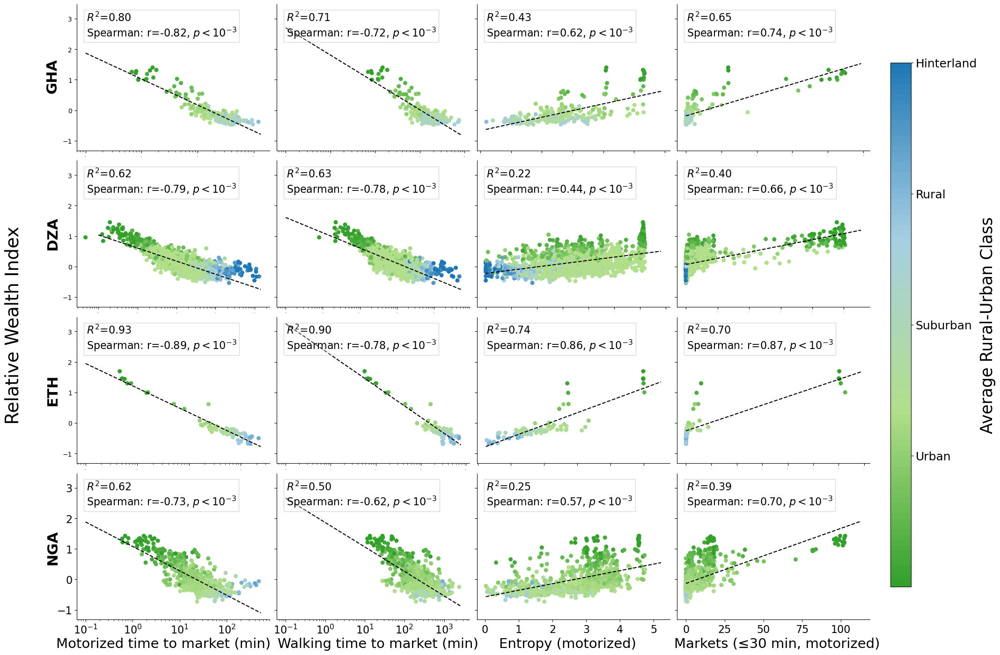

In [58]:

rururb_class = ['Urban', 'Suburban', 'Rural', 'Hinterland']

fig, axes = plt.subplots(4, 4, figsize=(22, 14), sharey=True, sharex=False)
class_cmap = LinearSegmentedColormap.from_list('class_cmap', class_colors, N=100)
# Create a color normalization object
norm = matplotlib.colors.Normalize(vmin=0, vmax=4)
sm = matplotlib.cm.ScalarMappable(cmap=class_cmap, norm=norm)

for i, country in enumerate(['gha', 'dza', 'eth', 'nga']):
    gdf = global_gdf[global_gdf['country_name'] == country]

    # Scatter plots
    sc1, r_sp_m, p_val_m = scatter_plot_2(axes[i][0], i, 'shortest_tt', 'Motorized time to market (min)', gdf, class_cmap, rururb_class, log_x=True, how="less", txt_pos=(0.05, 0.95))
    sc2, r_sp_w, p_val_w = scatter_plot_2(axes[i][1], i, 'shortest_tt_walk', 'Walking time to market (min)', gdf, class_cmap, rururb_class, log_x=True, how="less", txt_pos=(0.05, 0.95))
    sc3, r_sp_en, p_val_en = scatter_plot_2(axes[i][2], i, 'entropy', 'Entropy (motorized)', gdf, class_cmap, rururb_class, log_x=False, how="greater", txt_pos=(0.05, 0.95))
    sc4, r_sp_cum, p_val_cum = scatter_plot_2(axes[i][3], i, 'pure_cumul', 'Markets (≤30 min, motorized)', gdf, class_cmap, rururb_class, log_x=False, how="greater", txt_pos=(0.05, 0.95))


# Add common labels
fig.text(0.0, 0.5, 'Relative Wealth Index', va='center', rotation='vertical', fontsize=28)

fig.text(0.05, 0.013, 'Motorized time to market (min)', va='center', rotation='horizontal', fontsize=21)
fig.text(0.265, 0.013, 'Walking time to market (min)', va='center', rotation='horizontal', fontsize=21)
fig.text(0.48, 0.013, 'Entropy (motorized)', va='center', rotation='horizontal', fontsize=21)
fig.text(0.65, 0.013, 'Markets (≤30 min, motorized)', va='center', rotation='horizontal', fontsize=21)


fig.text(0.04, 0.88, 'GHA', weight = 'bold', va='center', rotation='vertical', fontsize=22)
fig.text(0.04, 0.64, 'DZA', weight = 'bold', va='center', rotation='vertical', fontsize=22)
fig.text(0.04, 0.4, 'ETH', weight = 'bold', va='center', rotation='vertical', fontsize=22)
fig.text(0.04, 0.16, 'NGA', weight = 'bold', va='center', rotation='vertical', fontsize=22)

# Adjust layout
plt.subplots_adjust(right=0.84, left=0.07, bottom = 0.05, hspace=0.07)
# Colorbar
cbar_ax = fig.add_axes([0.86, 0.1, 0.02, 0.8])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
cbar.set_ticks([1, 2, 3, 4])
cbar.set_ticklabels(rururb_class, fontsize=18)
cbar.set_label("Average Rural-Urban Class", fontsize=25)

# plt.savefig('./figs/corr_plots/RWI/RWI_examples.pdf')
plt.show()


/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_79210/1285116572.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)


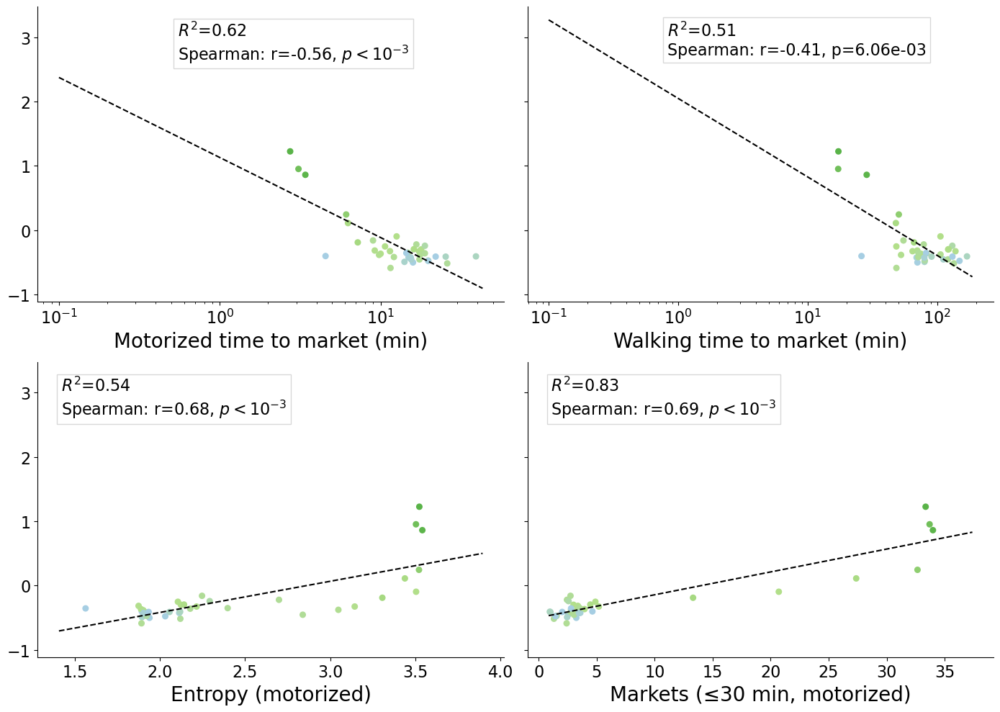

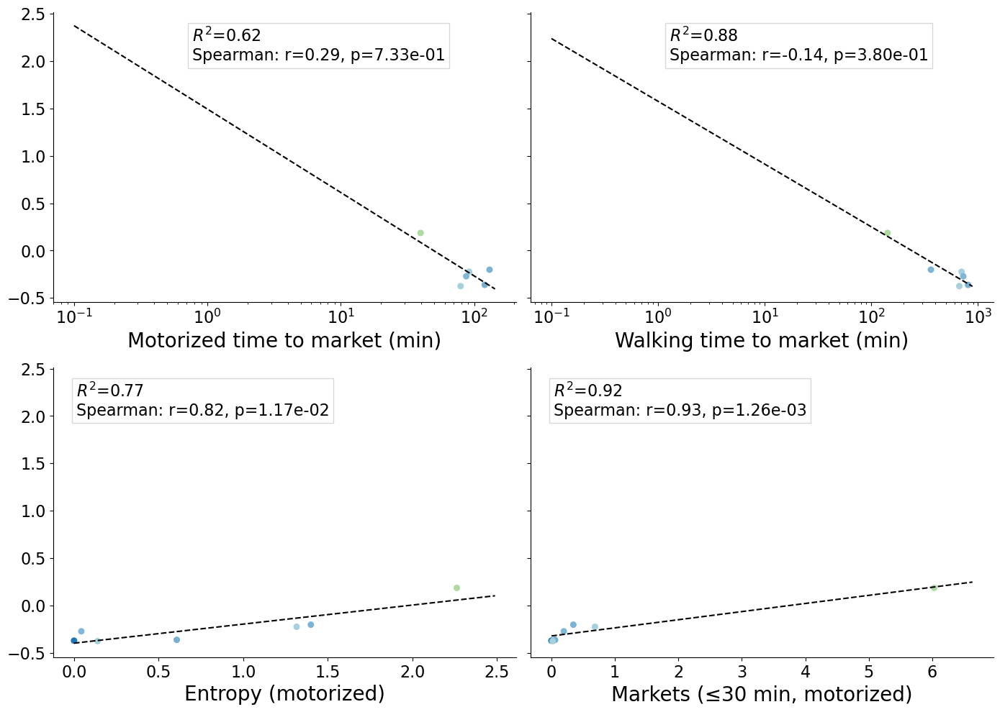

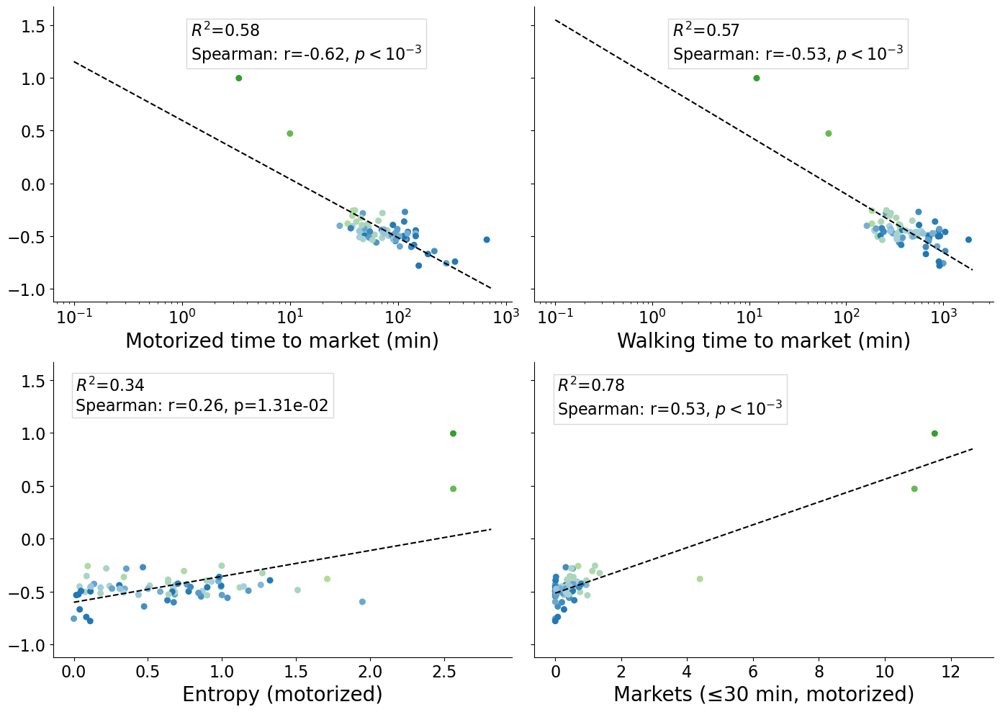

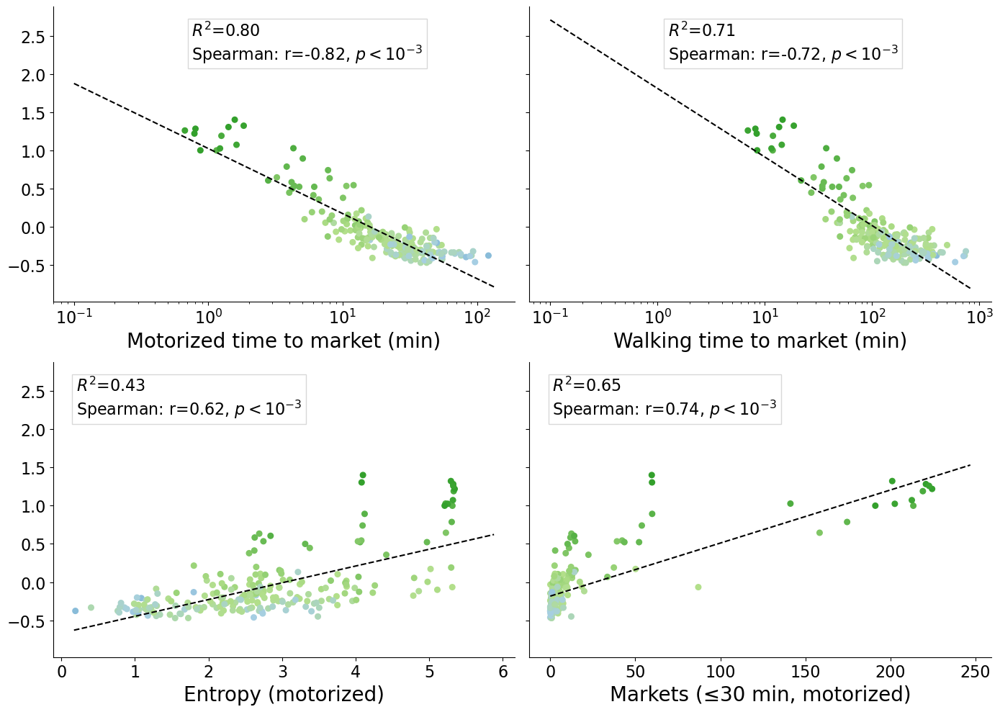

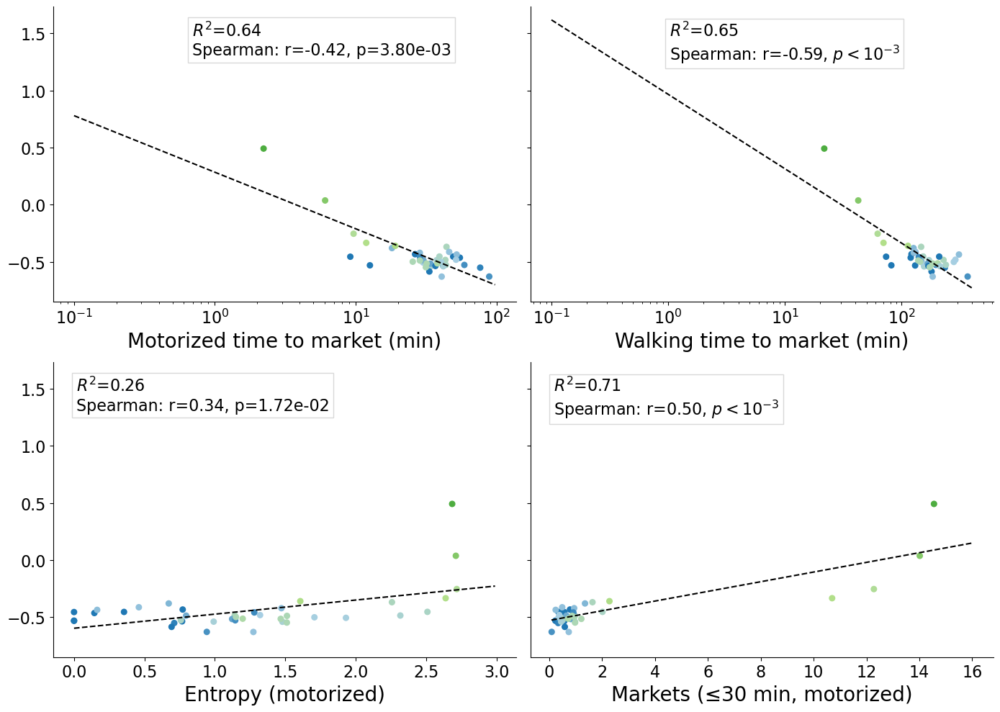

...

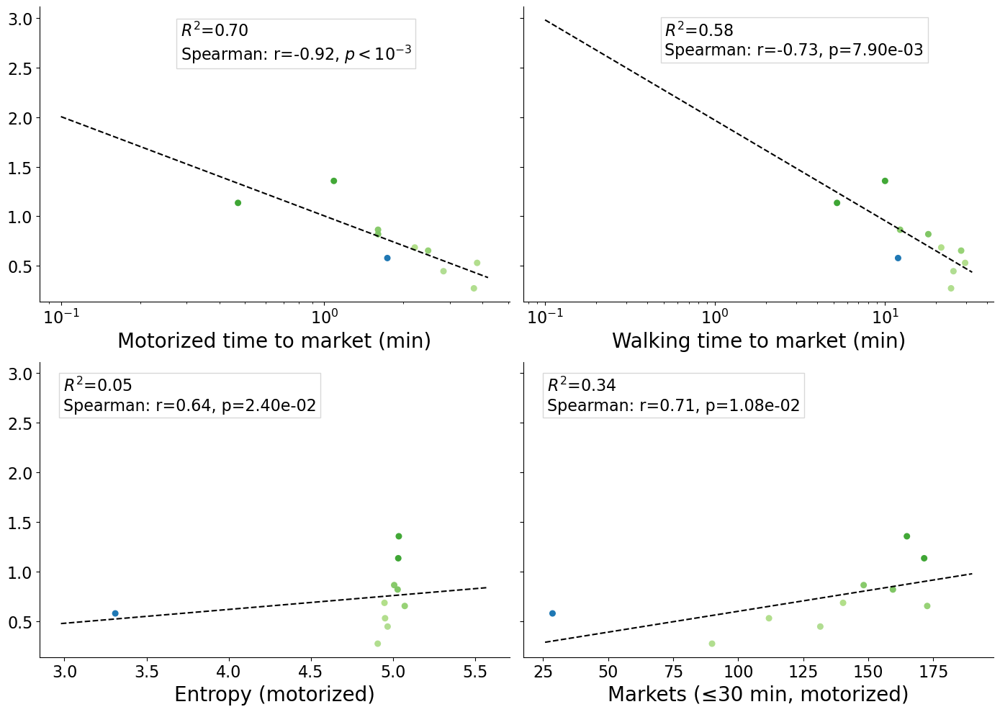

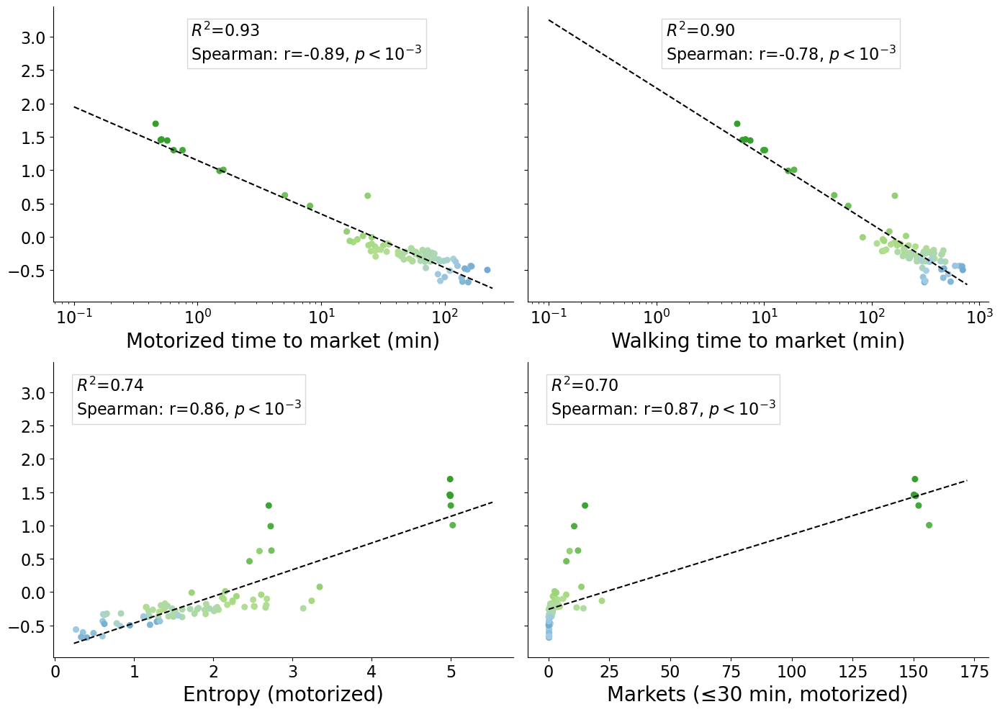

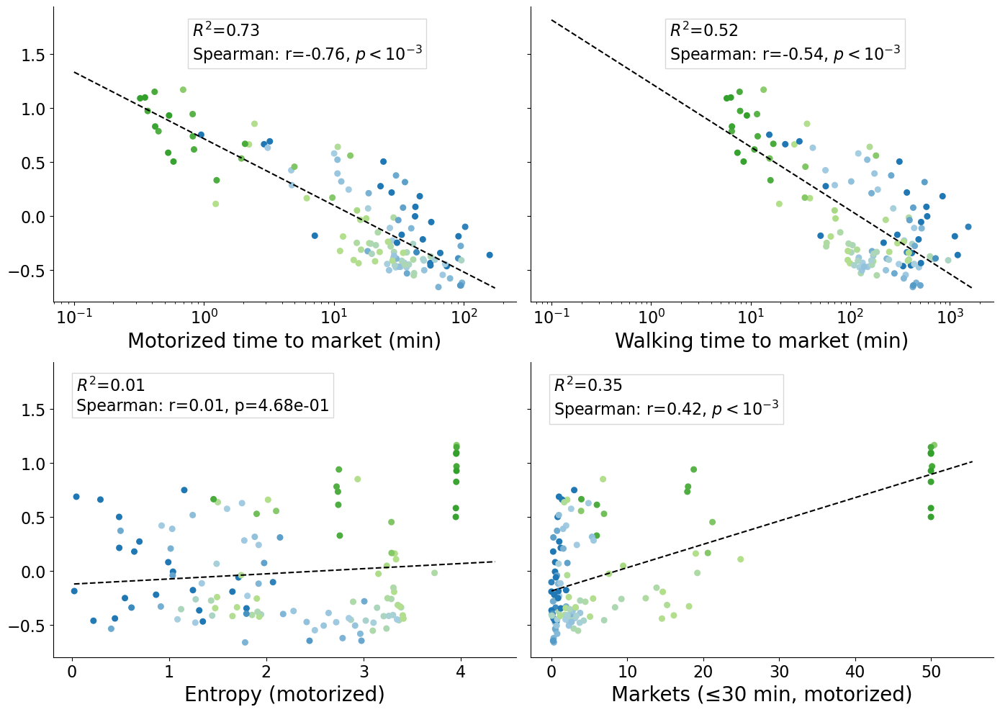

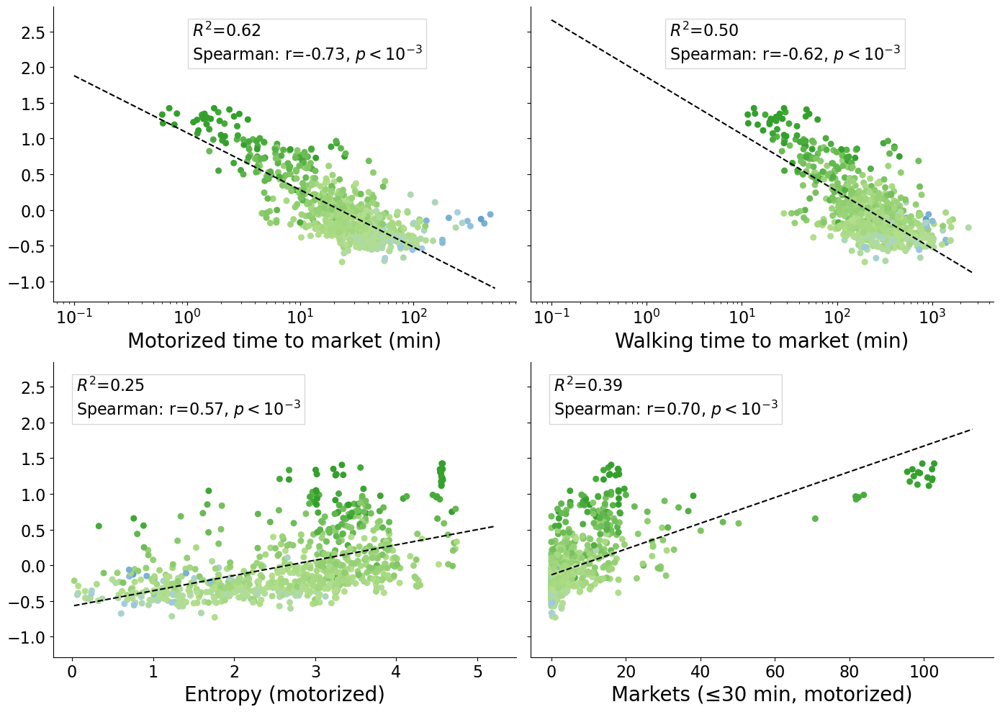

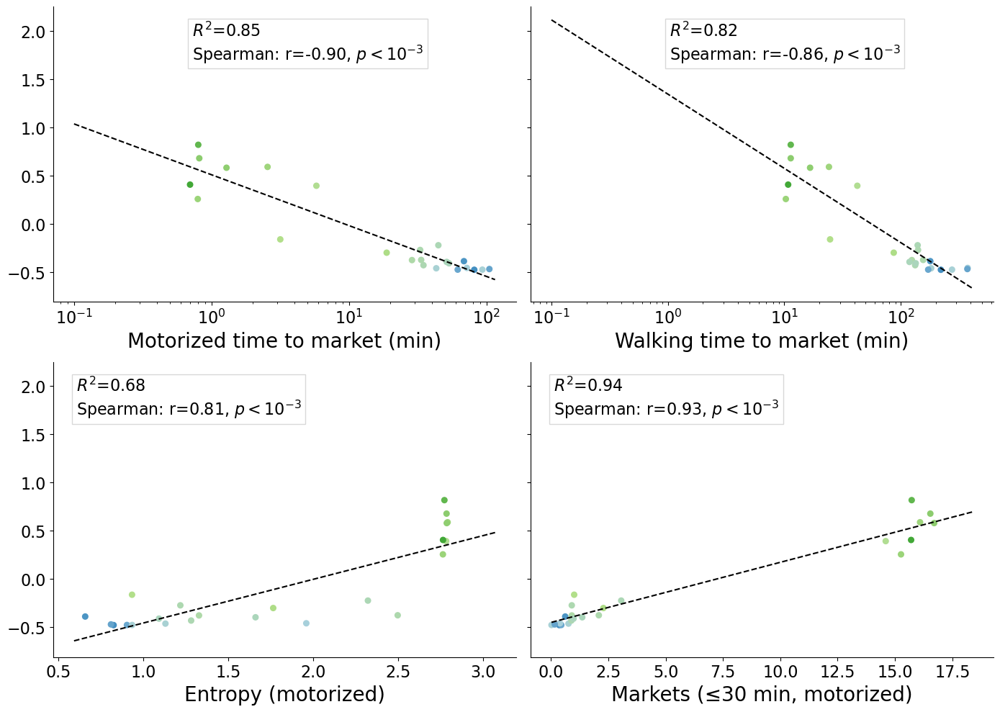

In [11]:

# Create a ListedColormap
rururb_class = ['Urban', 'Suburban', 'Rural', 'Hinterland']

paired_cmap = matplotlib.colormaps['Paired']
paired_colors = [to_rgba(paired_cmap(i / 12)) for i in range(12)]
class_colors = [paired_colors[3], paired_colors[2], paired_colors[0], paired_colors[1]]
class_colors_dict = {i:j for i, j in zip(rururb_class, class_colors)}
    
class_cmap = LinearSegmentedColormap.from_list('class_cmap', class_colors, N=100)
# Create a color normalization object
norm = matplotlib.colors.Normalize(vmin=0, vmax=4)
sm = matplotlib.cm.ScalarMappable(cmap=class_cmap, norm=norm)

# Function to create scatter plots
def scatter_plot(ax, x_col, x_label, global_gdf, cmap, rururb_class, how, txt_pos, log_x=False):
    X = np.array(global_gdf[x_col])
    y = np.array(global_gdf['rwi'])

    if log_x:
        y_log = y[X>0]
        X_log = X[X>0]
            
        reg = linear_model.LinearRegression()
        reg.fit(np.log(X_log).reshape(-1, 1), np.array(y_log).reshape(-1, 1))
        
        # regression coefficients
        m = reg.coef_[0][0]
        n = reg.intercept_[0]
        R2 = reg.score(np.log(X_log).reshape(-1, 1), np.array(y_log).reshape(-1, 1))
        
        x_vals = np.linspace(0.1, max(X) * 1.1, 200)
        ax.plot(x_vals, np.log(x_vals) * m + n, '--', color='black')

        ax.set_xscale('log')  # Apply log scale

    else:
        # Fit regression normally
        reg = linear_model.LinearRegression()
        reg.fit(X.reshape(-1, 1), y.reshape(-1, 1))
        m, n = reg.coef_[0][0], reg.intercept_[0]
        R2 = reg.score(X.reshape(-1, 1), y.reshape(-1, 1))

        x_vals = np.linspace(min(X) * 0.9, max(X) * 1.1, 200)
        ax.plot(x_vals, x_vals * m + n, '--', color='black')

    
    # Scatter plot
    sc = plot_corr_RWI(ax, global_gdf, 'rwi', x_col, cmap, rururb_class, R2, how, txt_pos, log_x=False)
    spearman_corr, spearman_pval = spearmanr(X, y, alternative = how)
    
    ax.set_xlabel(x_label, fontsize=20)
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='both', labelsize=16)

    return (sc, spearman_corr, spearman_pval)

r_moto_ls_admin = []
r_walk_ls_admin = []
r_en_ls_admin = []
r_cum_ls_admin = []

for country in global_gdf.country_name.unique():
    gdf = global_gdf[global_gdf['country_name'] == country]
    # Define figure and subplots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)
    axes = axes.flatten()

    # Generate scatter plots
    sc1, r_sp_m, p_val_m = scatter_plot(axes[0], 'shortest_tt', 'Motorized time to market (min)', gdf, class_cmap, 
                       rururb_class, log_x=True, how = "less", txt_pos = (0.3, 0.95))
    sc2, r_sp_w, p_val_w = scatter_plot(axes[1], 'shortest_tt_walk', 'Walking time to market (min)', gdf, class_cmap, 
                       rururb_class, log_x=True, how = "less", txt_pos = (0.3, 0.95))
    sc3, r_sp_en, p_val_en  = scatter_plot(axes[2], 'entropy', 'Entropy (motorized)', gdf, class_cmap, 
                       rururb_class, log_x=False, how = "greater", txt_pos = (0.05, 0.95))
    sc4, r_sp_cum, p_val_cum = scatter_plot(axes[3], 'pure_cumul', 'Markets (≤30 min, motorized)', gdf, class_cmap, 
                       rururb_class, log_x=False, how = "greater", txt_pos = (0.05, 0.95))
    
    r_moto_ls_admin.append([r_sp_m, p_val_m])
    r_walk_ls_admin.append([r_sp_w, p_val_w])
    r_en_ls_admin.append([r_sp_en, p_val_en])
    r_cum_ls_admin.append([r_sp_cum, p_val_cum])

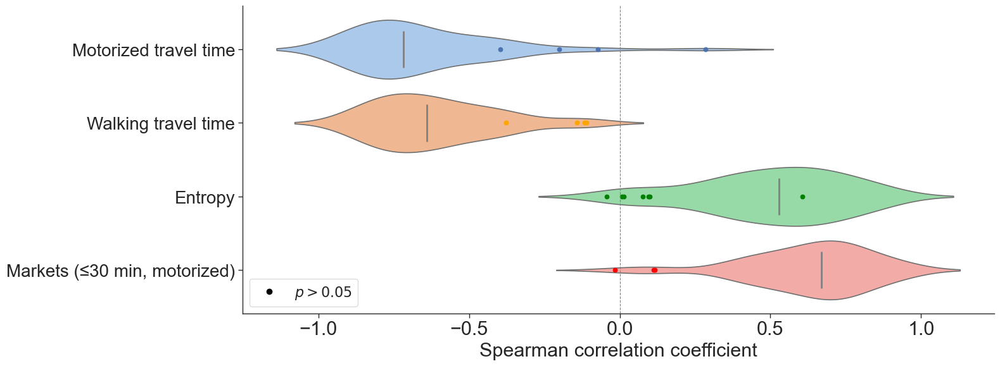

42 42 42 42 46


In [13]:
r_moto_ls_admin = np.array(r_moto_ls_admin)
r_walk_ls_admin = np.array(r_walk_ls_admin)
r_en_ls_admin = np.array(r_en_ls_admin)
r_cum_ls_admin = np.array(r_cum_ls_admin)

palette = sns.color_palette("pastel", n_colors=4)

df = pd.DataFrame({
    'Motorized travel time': r_moto_ls_admin[:, 0],
    'Walking travel time': r_walk_ls_admin[:, 0],
    'Entropy': r_en_ls_admin[:, 0],
    'Markets (≤30 min, motorized)': r_cum_ls_admin[:, 0]
})

df_melted = df.melt(var_name="Accessibility Type", value_name="Spearman Correlation")

# Set style
sns.set(style="ticks", context='paper', font_scale=1.4, rc={
    'axes.titlesize': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
})

# Create figure
fig, ax = plt.subplots(figsize=(16, 6))
violin_parts = sns.violinplot(
    y="Accessibility Type", 
    x="Spearman Correlation", 
    hue = "Accessibility Type",
    orient = "h",
    data=df_melted, 
    inner=None, 
    palette="pastel", 
    linewidth=1.2,
    ax=ax
)
ax.scatter(r_moto_ls_admin[r_moto_ls_admin[:, 1] > 0.05][:, 0],
           np.zeros_like(r_moto_ls_admin[r_moto_ls_admin[:, 1] > 0.05][:, 0]), color = 'b')

ax.scatter(r_walk_ls_admin[r_walk_ls_admin[:, 1] > 0.05][:, 0],
           np.ones_like(r_walk_ls_admin[r_walk_ls_admin[:, 1] > 0.05][:, 0]), color = 'orange')

ax.scatter(r_en_ls_admin[r_en_ls_admin[:, 1] > 0.05][:, 0],
           np.ones_like(r_en_ls_admin[r_en_ls_admin[:, 1] > 0.05][:, 0])*2, color = 'green')

ax.scatter(r_cum_ls_admin[r_cum_ls_admin[:, 1] > 0.05][:, 0],
            np.ones_like(r_cum_ls_admin[r_cum_ls_admin[:, 1] > 0.05][:, 0])*3, color = 'red')

# Add horizontal mean lines
categories = df.columns.tolist()
for i, cat in enumerate(categories):
    mean_val = df[cat].median()
    # Find the width of the violin — this is approximate, set width manually
    ax.vlines(mean_val, i - 0.25, i + 0.25, color='gray', linewidth=2, zorder=10)

# Aesthetics
ax.set_xlabel("Spearman correlation coefficient", fontsize=22)
ax.set_ylabel("")
ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
plt.xticks(fontsize = 22)
plt.yticks(rotation=0, fontsize = 20, ma = 'center')

# Custom legend handle for non-significant points
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=r'$p > 0.05$',
           markerfacecolor='black', markersize=8)
]

ax.legend(handles=legend_elements, loc='lower left', fontsize=16, frameon=True)
ax.spines[['right', 'top']].set_visible(False)
plt.tight_layout()
plt.savefig('./figs/corr_plots/RWI/violin_plot.pdf')
plt.show()

print(len(r_moto_ls_admin[np.array(r_moto_ls_admin)[:, 1]<=0.05]), 
      len(r_moto_ls_admin[np.array(r_moto_ls_admin)[:, 1]<=0.05]),
     len(r_moto_ls_admin[np.array(r_moto_ls_admin)[:, 1]<=0.05]),
     len(r_moto_ls_admin[np.array(r_moto_ls_admin)[:, 1]<=0.05]), len(r_moto_ls_admin))

## Correlation with IPC data
1. Average last 5 years of data
2. Correlation at Admin 1 level between IPC and Market Accessibility

In [75]:
# Load Dataset
IPC_dataset = pd.read_csv("../shared_data/IPC_data/ipc_global_level1_wide.csv")

IPC_dataset = IPC_dataset[1:]

#drop all prediction columns
for i, col in enumerate(IPC_dataset.columns):
    if i > 4:
        if 'projection' in col:
            IPC_dataset = IPC_dataset.drop(col, axis = 1)
            
# Crop to African countries
gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')
ISO3_ls = [gdf.iloc[row]['ISO3'] for row in range(len(gdf))]

IPC_africa = pd.DataFrame()

for iso3 in ISO3_ls:
    try:
        iso3 = iso3.upper()
        IPC_country = IPC_dataset[IPC_dataset['Country'] == iso3]
        if len(IPC_africa) == 0:
            IPC_africa = IPC_country
        else:
            IPC_africa = pd.concat([IPC_africa, IPC_country])
    except Exception as e:
        print(e)
        continue

# Convert all columns to float where possible
for col in IPC_africa.columns:
    
    if 'current' in col or 'population' in col:
        try:
            IPC_africa[col] = pd.to_numeric(IPC_africa[col], errors='coerce')  # Convert column to numeric (floats)
        except Exception as e:
            print(e)
            continue

# Check the result
IPC_africa = IPC_africa.dropna(axis = 0)

IPC_africa['Year_of_analysis'] = [int(IPC_africa['Date of analysis'].iloc[i][-4:]) for i in range(len(IPC_africa))]
IPC_africa

'NoneType' object has no attribute 'upper'
'NoneType' object has no attribute 'upper'
'NoneType' object has no attribute 'upper'
'NoneType' object has no attribute 'upper'


,Date of analysis,Country,Total country population,Level 1,Current from,Current to,Population analyzed current,Phase 3+ number current,Phase 3+ percentage current,Phase 1 number current,Phase 1 percentage current,Phase 2 number current,Phase 2 percentage current,Phase 3 number current,Phase 3 percentage current,Phase 4 number current,Phase 4 percentage current,Phase 5 number current,Phase 5 percentage current,Year_of_analysis
1890,Apr 2024,SDN,47208125.0,South Kordofan,2024-04-01,2024-05-31,2098395.0,1018272.0,0.48,349328.0,0.17,730795.0,0.35,699840.0,0.33,301927.0,0.14,16505.0,0.01,2024
1891,Apr 2024,SDN,47208125.0,East Darfur,2024-04-01,2024-05-31,1772902.0,686566.0,0.39,377706.0,0.21,708630.0,0.40,570018.0,0.32,116327.0,0.07,221.0,0.00,2024
1892,Apr 2024,SDN,47208125.0,Blue Nile,2024-04-01,2024-05-31,1470448.0,734784.0,0.50,270781.0,0.18,464884.0,0.32,558449.0,0.38,176335.0,0.12,0.0,0.00,2024
1893,Apr 2024,SDN,47208125.0,Central Darfur,2024-04-01,2024-05-31,1998753.0,1167817.0,0.58,253069.0,0.13,577867.0,0.29,725513.0,0.36,442304.0,0.22,0.0,0.00,2024
1894,Apr 2024,SDN,47208125.0,Gedaref,2024-04-01,2024-05-31,3146052.0,966142.0,0.31,931690.0,0.30,1248220.0,0.40,872801.0,0.28,93341.0,0.03,0.0,0.00,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3249,Feb 2019,ZWE,14645000.0,Mashonaland West,2019-02-01,2019-05-31,1229000.0,292000.0,0.24,604000.0,0.49,333000.0,0.27,218000.0,0.18,74000.0,0.06,0.0,0.00,2019
3250,Feb 2019,ZWE,14645000.0,Matabeleland South,2019-02-01,2019-05-31,647000.0,167000.0,0.26,314000.0,0.48,166000.0,0.26,111000.0,0.17,56000.0,0.09,0.0,0.00,2019
3251,Feb 2019,ZWE,14645000.0,Mashonaland Central,2019-02-01,2019-05-31,1166000.0,355000.0,0.31,556000.0,0.47,255000.0,0.22,243000.0,0.21,112000.0,0.10,0.0,0.00,2019
3252,Feb 2019,ZWE,14645000.0,Manicaland,2019-02-01,2019-05-31,1602000.0,557000.0,0.35,547000.0,0.34,498000.0,0.31,333000.0,0.21,224000.0,0.14,0.0,0.00,2019


In [76]:
# Averaging over the last n_years

IPC_avg = pd.DataFrame()
#number of years to average
n_years = 5
for admin in IPC_africa['Level 1'].unique():
    
    IPC_country = IPC_africa[IPC_africa['Level 1'] == admin]
    iso3 = IPC_country['Country'].iloc[0]
    IPC_country = IPC_country.sort_values(by='Date of analysis', ascending=False) 
    latest_year = IPC_country['Year_of_analysis'].max()
    first_year = IPC_country['Year_of_analysis'].min()
    delta_t = latest_year-first_year
    # take only data older than 3 years
    if delta_t>=(n_years-1):
        
        IPC_years = IPC_country[IPC_country['Year_of_analysis'] >= latest_year-(n_years-1)]
        
        # print(pd.DataFrame(IPC_country[IPC_country['Year_of_analysis'] >= latest_year-4]))
        IPC_mean = pd.DataFrame(IPC_years.select_dtypes(include=np.number).mean(axis = 0)).T
        IPC_std = pd.DataFrame(IPC_years.select_dtypes(include=np.number).std(axis = 0)).T
        IPC_std = IPC_std.rename(columns=lambda x: f"{x}_std")
        
        IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
        # IPC_years.loc['Date of analysis'].astype(np.dtype('datetime64[ns]'))
        max_date = IPC_years['Date of analysis'].max()
        min_date = IPC_years['Date of analysis'].min()

        IPC_diff = IPC_years[IPC_years['Date of analysis'] == max_date].select_dtypes(include=np.number)\
                   .reset_index().subtract(IPC_years[IPC_years['Date of analysis'] == min_date].select_dtypes(
                    include=np.number).reset_index())
        
        for col in IPC_diff.columns:
            if 'percentage current' not in col:
                IPC_diff = IPC_diff.drop(col, axis = 1)

        IPC_diff = IPC_diff.rename(columns=lambda x: f"{x}_diff")



    else:
        continue

    
    IPC_mean['Level_1'] = admin
    IPC_std['Level_1'] = admin
    IPC_diff['Level_1'] = admin
    IPC_mean = IPC_mean.merge(IPC_std)
    IPC_mean = IPC_mean.drop(labels = ['Year_of_analysis_std'], axis=1)
    
    # if len(IPC_country)>n_years:
    IPC_mean = IPC_mean.merge(IPC_diff)

    IPC_mean['Country'] = iso3
    if len(IPC_avg) == 0:
        IPC_avg = IPC_mean
    else:
        IPC_avg = pd.concat([IPC_avg, IPC_mean])
IPC_avg

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: Dep

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325600489.py:24: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  IPC_years.loc[:, 'Date of analysis'] = pd.to_datetime(IPC_years['Date of analysis'], format='%b %Y')
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/2325

,Total country population,Population analyzed current,Phase 3+ number current,Phase 3+ percentage current,Phase 1 number current,Phase 1 percentage current,Phase 2 number current,Phase 2 percentage current,Phase 3 number current,Phase 3 percentage current,...,Phase 4 percentage current_std,Phase 5 number current_std,Phase 5 percentage current_std,Phase 3+ percentage current_diff,Phase 1 percentage current_diff,Phase 2 percentage current_diff,Phase 3 percentage current_diff,Phase 4 percentage current_diff,Phase 5 percentage current_diff,Country
0,47157104.4,2011064.2,709280.0,0.350,609829.0,0.302,691955.2,0.346,511414.6,0.254,...,0.043359,7381.260394,0.004472,0.10,-0.07,-0.02,0.05,0.04,0.01,SDN
0,47157104.4,1255633.4,376986.4,0.288,378068.0,0.310,500579.2,0.400,289048.2,0.218,...,0.046904,98.834205,0.000000,0.19,-0.12,-0.06,0.15,0.04,0.00,SDN
0,47157104.4,1363142.4,433104.8,0.312,416577.2,0.306,513460.6,0.376,326865.2,0.236,...,0.027019,0.000000,0.000000,0.16,-0.09,-0.06,0.11,0.05,0.00,SDN
0,47157104.4,1824434.0,680941.8,0.364,534206.2,0.298,609286.4,0.334,448706.4,0.240,...,0.065038,0.000000,0.000000,0.28,-0.37,0.10,0.15,0.13,0.00,SDN
0,47157104.4,2651881.0,657628.4,0.244,904393.2,0.344,1089859.2,0.414,570697.2,0.212,...,0.026077,0.000000,0.000000,0.12,-0.02,-0.08,0.09,0.02,0.00,SDN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,18886851.8,473420.8,94506.2,0.176,169021.8,0.386,209893.0,0.440,94506.2,0.176,...,0.000000,0.000000,0.000000,0.11,-0.01,-0.09,0.11,0.00,0.00,ZMB
0,18886851.8,1210014.0,132052.8,0.106,509125.4,0.476,568836.0,0.420,132052.8,0.106,...,0.000000,0.000000,0.000000,0.05,-0.17,0.12,0.05,0.00,0.00,ZMB
0,18886851.8,2045184.2,262267.4,0.160,937394.8,0.452,845522.6,0.392,261910.2,0.156,...,0.008944,0.000000,0.000000,-0.05,-0.04,0.10,-0.03,-0.02,0.00,ZMB
0,18886851.8,840248.0,179703.4,0.214,299235.6,0.354,361309.2,0.432,176372.2,0.210,...,0.004472,0.000000,0.000000,0.13,-0.22,0.09,0.13,-0.01,0.00,ZMB


In [77]:
country_num_ls = os.listdir('./computed_acc')
africa_gdf_IPC = gpd.GeoDataFrame()

In [78]:
# List of countries
cmap = matplotlib.colormaps['RdBu_r']
# norm = BoundaryNorm(percentile_bins, cmap.N)
request_fails = []
wrong_numbers = {74:70001, 6: 40764, 217:278}
africa_gdf = gpd.read_file('../shared_data/africa_borders/afr_g2014_2013_0.shp')

# Second pass: plot the data
for country_iso3 in country_num_ls:
    try:
        country_num = int(africa_gdf.loc[africa_gdf['ISO3'] == country_iso3.upper()]['ADM0_CODE'].values[0])
    except:
        continue
        
    # Load WorldPop to get extent and transform
    for path in os.listdir(f"../shared_data/worldpop_rasters/{country_iso3}"):
        if path.endswith('cropped.tif'):
            chosen_path = path
    wpp_path = f"../shared_data/worldpop_rasters/{country_iso3}/{chosen_path}"
    with rasterio.open(wpp_path, "r") as src:
        transform = src.transform
        worldpop_arr = src.read()[0]
        worldpop_arr = np.where(worldpop_arr<0, 0, worldpop_arr)
    
    # print('loaded population')
    en_path = f'./computed_acc/{country_iso3}/entropy_mod_4h_moto.tif'
    shortest_tt_path = f'./computed_acc/{country_iso3}/shortest_moto_tt.tif'
    shortest_walinkg_tt_path = f'./computed_acc/{country_iso3}/shortest_walk_tt.tif'
    acc_path_pure_cumul = f'./computed_acc/{country_iso3}/acc_pure_cumul_moto.tif'
    
    with rasterio.open(en_path, 'r') as f:
        entropy = align_extent_raster(wpp_path, f)[0]

    # print('loaded entropy')

    with rasterio.open(shortest_tt_path, 'r') as f:
        shortest_tt = align_extent_raster(wpp_path, f)[0]


    with rasterio.open(shortest_walinkg_tt_path, 'r') as f:
        shortest_walking_tt = align_extent_raster(wpp_path, f)[0]

    # print('loaded shortest tt.')

    with rasterio.open(acc_path_pure_cumul, 'r') as f:
        acc_pure_cumul = align_extent_raster(wpp_path, f)[0]

    # print('threshold cumul')

    # Load country boundaries
    try:
        if country_num in wrong_numbers.keys():
            correct_num = wrong_numbers[country_num]
        else:
            correct_num = country_num
        country_adm_gdf = get_geodata(correct_num)
        country_adm_gdf['country_num'] = np.ones(len(country_adm_gdf))*country_num
        
        # get iso3 of the country
        adm0_gdf = gpd.read_file(f'../shared_data/africa_markets/borders/{country_iso3}.geojson')
        iso3 = adm0_gdf['ISO3'].iloc[0]
        country_adm_gdf['ISO3'] = [iso3 for i in range(len(country_adm_gdf))]
                   
        
    except Exception as e:
        print(e)
        request_fails.append(country_num)
        continue

    populations = []
    # acc_cumul_admin = []
    short_tt_admin = []
    entropy_adm = []
    pure_cumul_adm = []
    RI_admin = []
    walk_tt_adm = []
    
    rur_urb_arr = align_extent_raster(wpp_path, rur_urb_rast)[0]

    class_rur_urb_arr = build_class_rurub_arr(rur_urb_arr)
    
    wpp_rast = rasterio.open(wpp_path, "r")
    
    for i, poly in enumerate(country_adm_gdf['geometry']):
        
        clipped_rwi, _, _ =  raster_geometry_mask(wpp_rast, [mapping(poly)], 
                                                crop=False, invert = True, all_touched = True)
        
        true_points = ~(np.ones_like(clipped_rwi)&clipped_rwi)
        # true_points = np.ones_like(worldpop_arr)
        # true_points = (worldpop_arr == 0)
        # take the smallest points and use them as the top left of your crop
        top_left = true_points.min(axis=0)
        # take the largest points and use them as the bottom right of your crop
        bottom_right = true_points.max(axis=0)

        RI_masked = np.copy(class_rur_urb_arr)
        RI_masked[true_points] = 0
        RI_masked[RI_masked<0] = 0
    
        # access_mat_cumul_masked = np.copy(access_mat_cumul)
        # access_mat_cumul_masked[true_points] = 0
    
        pure_cumul_masked = np.copy(acc_pure_cumul)
        pure_cumul_masked[true_points] = 0
    
        shortest_tt_rast_masked = np.copy(shortest_tt)
        shortest_tt_rast_masked[true_points] = 0

        shortest_tt_walking_masked = np.copy(shortest_walking_tt)
        shortest_tt_walking_masked[true_points] = 0
        
        entropy_masked = np.copy(entropy)
        entropy_masked[true_points] = 0
    
    
        pop_masked_arr = np.copy(worldpop_arr)
        pop_masked_arr[true_points] = 0
    
        pop_masked_arr[pop_masked_arr < 0] = 0
        tot_pop = np.sum(pop_masked_arr)
    
        pop_masked_arr_tt = np.copy(pop_masked_arr)
        pop_masked_arr_tt[np.isinf(shortest_tt_rast_masked)] = np.nan
        pop_masked_arr_tt[np.isnan(shortest_tt_rast_masked)] = np.nan
    
        shortest_tt_rast_masked[np.isinf(shortest_tt_rast_masked)] = np.nan
        shortest_tt_rast_masked[np.isnan(shortest_tt_rast_masked)] = np.nan
    
        pop_masked_arr_entropy = np.copy(pop_masked_arr)
        pop_masked_arr_entropy[np.isinf(entropy_masked)] = np.nan
        pop_masked_arr_entropy[np.isnan(entropy_masked)] = np.nan
    
        entropy_masked[np.isinf(entropy_masked)] = 0
        entropy_masked[np.isnan(entropy_masked)] = 0
        
    
        if tot_pop > 0:
            
            # weighted_mean_acc_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)] *\
            #                                  access_mat_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(access_mat_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(access_mat_cumul_masked)]))
            
            weighted_mean_pure_cumul = np.nansum(pop_masked_arr[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)] *\
                                             pure_cumul_masked[np.isfinite(pop_masked_arr) & np.isfinite(pure_cumul_masked)]/np.nansum(pop_masked_arr[np.isfinite(pure_cumul_masked)]))
            
            weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked) & np.isfinite(pop_masked_arr)]))
            
            weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
                                      /np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked) & np.isfinite(pop_masked_arr)]))
            
            weighted_mean_entr = np.nansum(pop_masked_arr[np.isfinite(entropy_masked)] * entropy_masked[np.isfinite(entropy_masked)]\
                                        /np.nansum(pop_masked_arr[np.isfinite(entropy_masked)]))
            
            weighted_mean_RI = np.nansum(pop_masked_arr[np.isfinite(RI_masked)] * RI_masked[np.isfinite(RI_masked)]\
                          /np.nansum(pop_masked_arr[np.isfinite(RI_masked)]))
    
        else:
            # Handle cases where population is zero to avoid division by zero
            # weighted_mean_acc_cumul = 0
            weighted_mean_tt = 0
            weighted_mean_entr = 0 
            weighted_mean_pure_cumul = 0
            weighted_mean_RI = 0
            weighted_mean_walking_tt = 0
            
        populations.append(tot_pop)
        # acc_cumul_admin.append(weighted_mean_acc_cumul)
        short_tt_admin.append(weighted_mean_tt)
        entropy_adm.append(weighted_mean_entr)
        pure_cumul_adm.append(weighted_mean_pure_cumul)
        RI_admin.append(weighted_mean_RI)
        walk_tt_adm.append(weighted_mean_walking_tt)

        
    country_adm_gdf = country_adm_gdf[[c for c in country_adm_gdf.columns if 
                                           not c.endswith('_right') and not 
                                           c.endswith('_left') and not 
                                           c.endswith('_y')]]
    
    country_adm_gdf['tot_pop'] = populations
    # country_adm_gdf['acc_cumul'] = acc_cumul_admin
    country_adm_gdf['shortest_tt'] = short_tt_admin
    country_adm_gdf['shortest_tt_walk'] = walk_tt_adm
    country_adm_gdf['entropy'] = entropy_adm
    country_adm_gdf['pure_cumul'] = pure_cumul_adm
    country_adm_gdf['RI'] = RI_admin
    country_adm_gdf['country_name'] = [country_iso3 for g in range(len(country_adm_gdf))]

    if len(africa_gdf_IPC) == 0:
        africa_gdf_IPC = country_adm_gdf
    else:
        africa_gdf_IPC = gpd.GeoDataFrame(pd.concat([africa_gdf_IPC, country_adm_gdf], ignore_index=True), crs = country_adm_gdf.crs)
    wpp_rast.close()
country_num_ls = request_fails
print(country_num_ls)

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in divide
  weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in divide
  weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in

/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in divide
  weighted_mean_walking_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_walking_masked)] * shortest_tt_walking_masked[np.isfinite(shortest_tt_walking_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:147: RuntimeWarning: invalid value encountered in divide
  weighted_mean_tt = np.nansum(pop_masked_arr[np.isfinite(shortest_tt_rast_masked)] * shortest_tt_rast_masked[np.isfinite(shortest_tt_rast_masked)]\
/var/folders/7z/xy3tglwx2_dgnz41stkj54pc0000gn/T/ipykernel_72769/1006704761.py:150: RuntimeWarning: invalid value encountered in

[]


In [77]:
def mapping_df(column1, column2, threshold):
    
    def compute_similarity_matrix(column1, column2):
        similarity_matrix = np.zeros((len(column1), len(column2)))
        for i, str1 in enumerate(column1):
            for j, str2 in enumerate(column2):
                similarity_matrix[i][j] = 1 - Levenshtein.distance(str1, str2) / max(len(str1), len(str2))
        return similarity_matrix

    def map_strings(column1, column2, threshold=threshold):
        similarity_matrix = compute_similarity_matrix(column1, column2)
        row_ind, col_ind = linear_sum_assignment(-similarity_matrix)
        mapping = {}
        unmapped_column1 = set(column1)
        unmapped_column2 = set(column2)
        for i, j in zip(row_ind, col_ind):
            if similarity_matrix[i][j] >= threshold:
                mapping[column1[i]] = column2[j]
                unmapped_column1.discard(column1[i])
                unmapped_column2.discard(column2[j])
        return mapping, list(unmapped_column1), list(unmapped_column2)

    def map_column(column_to_map, reference_column, threshold=threshold):
        mapping, unmapped_column1, unmapped_column2 = map_strings(column_to_map, reference_column, threshold)
        mapped_column = [mapping[val] if val in mapping else np.nan for val in column_to_map]
        return mapped_column, unmapped_column1, unmapped_column2

    # Map values from Column1 to values in Column2 with a threshold 
    mapped_column, unmapped_column1, unmapped_column2 = map_column(column1, column2, threshold=threshold)

    d = {'original_wb': column1, 'mapped_wb': mapped_column}
    mapped_df = pd.DataFrame(data=d)

    return mapped_df, unmapped_column1, unmapped_column2

In [78]:
# merged = pd.DataFrame()
# for i, country_num in enumerate(set(IPC_avg.Country)):
    
#     country = str(africa_gdf_IPC[africa_gdf_IPC['ISO3'] == country_num]['ISO3'].iloc[0])
    
#     col1 = list(africa_gdf_IPC[africa_gdf_IPC['ISO3'] == country]['Name'])
#     col2 = list(IPC_avg[IPC_avg['Country'] == country]['Level_1'])
#     # print(len(col1), len(col2))
#     if len(col2) == 0 or len(col1) == 0:
#         continue
#     try:
#         df =pd.read_csv(f'../shared_data/admin1_join/{country}.csv')
#         continue
        
#     except:

#         merged_country, _, _ = mapping_df(col1, col2, 0.5)
#         merged_country.to_csv(f'../shared_data/admin1_join/{country}.csv')
#         display(col2)
#         input(f'Edit {country}.csv accordingly and press enter to continue...')
    
#         if len(merged) == 0:
#             merged = merged_country
#         else:
#             merged= pd.concat((merged, merged_country))
# print(len(IPC_avg.Level_1))
# print(len(merged))
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     print(len(merged.dropna()))
#     merged = merged.dropna()
#     display(merged[merged['original_wb'] != merged['mapped_wb']])

In [79]:
root_path = '../shared_data/admin1_join/'
for i, country_iso in enumerate(list(os.listdir(root_path))):
    merged_country = pd.read_csv(root_path+country_iso)
    if i==0:
        merged = merged_country
    else:
        merged = pd.concat((merged, merged_country))
merged = merged.dropna()
new_mrg = merged.merge(africa_gdf_IPC, left_on = 'original_wb', right_on = 'Name')
new_mrg = new_mrg.merge(IPC_avg, left_on = 'mapped_wb', right_on = 'Level_1')
joined_ipc_acc = gpd.GeoDataFrame(new_mrg, geometry = 'geometry')
joined_ipc_acc = joined_ipc_acc.set_crs(africa_gdf_IPC.crs)

In [80]:
def plot_IPC_corr(ax, x, y, xlabel, color, time = True):
    ax.spines[['right', 'top']].set_visible(False)
    if time == True:
        alternative = 'greater'
        x = x/60
    else:
        alternative = 'less'


    sns.boxplot(
        x=x, 
        y=y, 
        ax=ax, 
        orient="h",
        width=0.5, 
        color=color, 
        order=[3, 2, 1],
        boxprops=dict(edgecolor='black', linewidth=0.8),
        whiskerprops=dict(color='black', linewidth=0.8),
        capprops=dict(color='black', linewidth=0.8),
        medianprops=dict(color='black', linewidth=0.8),

        flierprops=dict(markerfacecolor='none', linewidth=.5, marker = "o"),
    )
    
    # Compute Pearson and Spearman correlations
    pearson_corr, pearson_pval = pearsonr(x, y)

    spearman_corr, spearman_pval = spearmanr(x, y, alternative = alternative)
    # Add correlation statistics to the plot
    text = (
        # f"Pearson: r={pearson_corr:.2f}, {format_pval(pearson_pval)}\n"
        f"Spearman: r={spearman_corr:.2f}, {format_pval(spearman_pval)}"
    )
    ax.text(0.5, 0.95, text, transform=ax.transAxes, fontsize=16, verticalalignment='top',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))
    
    # Axis labels and ticks
    ax.set_xlabel(xlabel, fontsize=22)
    ax.set_ylabel(' ')

    ax.set_yticks([0, 1, 2])
    ax.tick_params(axis='both', labelsize=22)
    
    # Remove grid
    ax.grid(False)

max_phase
1    0.730611
2    1.458361
3    1.663912
Name: shortest_tt, dtype: float64
iqr
max_phase
1     (1.4552511290999275, 0.440440655925278)
2    (2.6384667142070914, 0.9963726779726159)
3     (2.122134851403317, 1.1452862128595005)
Name: shortest_tt, dtype: object
max_phase
1    3.956736
2    6.778531
3    6.884679
Name: shortest_tt_walk, dtype: float64
iqr
max_phase
1      (6.818289936950159, 2.23878189064455)
2    (9.721094124986374, 3.7355807475612357)
3      (8.82249167808958, 6.219509332281342)
Name: shortest_tt_walk, dtype: object
max_phase
1    1.662738
2    0.907813
3    0.866209
Name: entropy, dtype: float64
iqr
max_phase
1     (2.768437147140503, 0.8815692067146301)
2    (1.2433872818946838, 0.6198069006204605)
3    (1.0151469111442566, 0.4703051820397377)
Name: entropy, dtype: object
max_phase
1    1.806766
2    0.643404
3    0.394261
Name: pure_cumul, dtype: float64
iqr
max_phase
1      (6.597865913706121, 0.5826966607744404)
2     (1.4155380169083478, 0.3947342683246

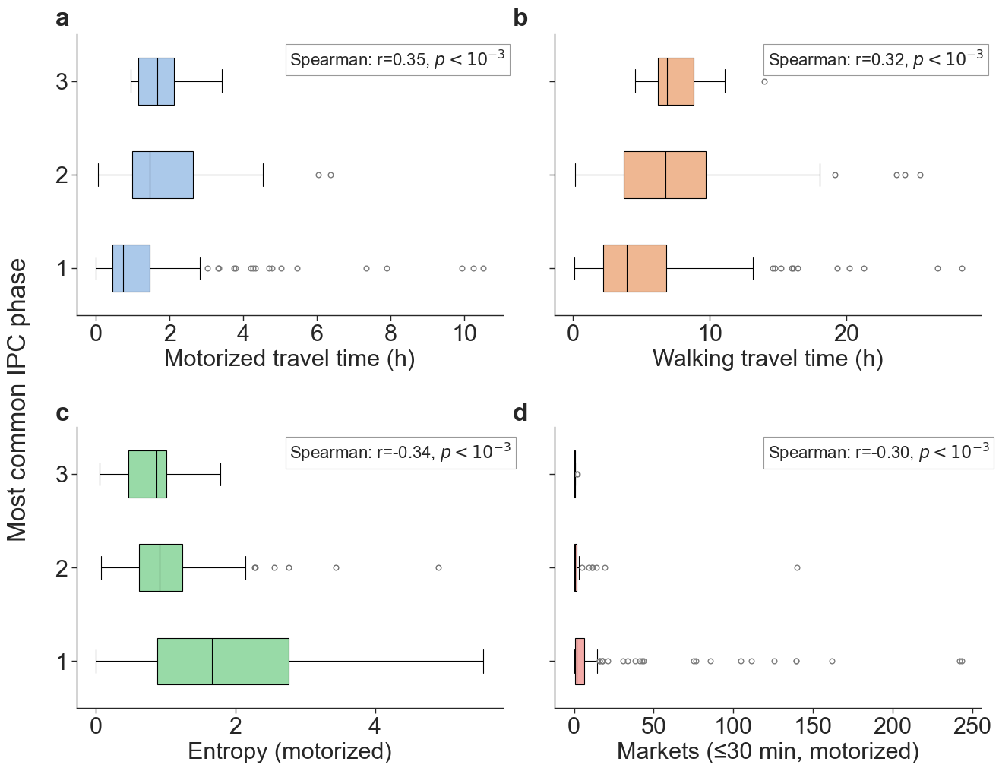

In [81]:

# Define accessibility metric label



perc_df = joined_ipc_acc[['Phase 1 percentage current','Phase 2 percentage current','Phase 3 percentage current',
                'Phase 4 percentage current', 'Phase 5 percentage current']]
# perc_df = joined_ipc_acc[['Phase 1 percentage current','Phase 2 percentage current','Phase 3+ percentage current']]

max_phase_ls = [np.argmax(np.array(perc_df.iloc[i,:]))+1 for i in range(len(perc_df))]
joined_ipc_acc['max_phase'] = max_phase_ls


# Create figure and axis
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)
axes = axes.flatten()
# Format p-values for display
def format_pval(pval):
    return r"$p < 10^{-3}$" if pval < 0.001 else f"p={pval:.2e}"
palette = sns.color_palette("pastel", n_colors=len(categories))

acc_label = 'shortest_tt'
plot_IPC_corr(axes[0], x=joined_ipc_acc[acc_label], 
              y=joined_ipc_acc['max_phase'], xlabel = 'Motorized travel time (h)',
              time = True, color = palette[0])
medians = joined_ipc_acc.groupby('max_phase')[acc_label].median()
print(medians/60)

iqr = joined_ipc_acc.groupby('max_phase')[acc_label].agg(lambda s: (s.quantile(0.75)/60, s.quantile(0.25)/60))
print('iqr')
print(iqr)

acc_label = 'shortest_tt_walk'
plot_IPC_corr(axes[1], x=joined_ipc_acc[acc_label], 
              y=joined_ipc_acc['max_phase'], xlabel = 'Walking travel time (h)',
              time = True, color = palette[1])

medians = joined_ipc_acc.groupby('max_phase')[acc_label].median()
print(medians/60)
iqr = joined_ipc_acc.groupby('max_phase')[acc_label].agg(lambda s: (s.quantile(0.75)/60, s.quantile(0.25)/60))
print('iqr')
print(iqr)

acc_label = 'entropy'
plot_IPC_corr(axes[2], x=joined_ipc_acc[acc_label], 
              y=joined_ipc_acc['max_phase'], xlabel = 'Entropy (motorized)',
              time = False, color = palette[2])

medians = joined_ipc_acc.groupby('max_phase')[acc_label].median()
print(medians)
iqr = joined_ipc_acc.groupby('max_phase')[acc_label].agg(lambda s: (s.quantile(0.75), s.quantile(0.25)))
print('iqr')
print(iqr)

acc_label = 'pure_cumul'
plot_IPC_corr(axes[3], x=joined_ipc_acc[acc_label], 
              y=joined_ipc_acc['max_phase'], xlabel = 'Markets (≤30 min, motorized)',
              time = False, color = palette[3])

medians = joined_ipc_acc.groupby('max_phase')[acc_label].median()
print(medians)
iqr = joined_ipc_acc.groupby('max_phase')[acc_label].agg(lambda s: (s.quantile(0.75), s.quantile(0.25)))
print('iqr')
print(iqr)

plt.tight_layout()
plt.subplots_adjust(right=0.95, left = 0.1, hspace = 0.4, top = 0.98)

# Common y-axis label
fig.text(0.035, 0.5, 'Most common IPC phase', va='center', rotation='vertical', fontsize=24)

fig.text(0.08, 1, 'a', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.51, 1, 'b', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.08, 0.48, 'c', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
fig.text(0.51, 0.48, 'd', weight = 'bold', va='center', rotation='horizontal', fontsize=24, fontname = 'sans-serif')
# plt.savefig('./figs/corr_plots/IPC/combined_box.pdf', bbox_inches='tight')
# Show the plot
plt.show()



## Accessibility in the largest African cities

In [82]:
city = "Cairo, Egypt"
gdf = ox.geocode_to_gdf(city)
country = 'egy'

# For polygon
polygon = gdf.geometry.iloc[0]


In [83]:
city_ls = ["Cairo, Egypt", 
           "Kinshasa, Democratic Republic of the Congo",
           "Lagos, Nigeria",
           "Luanda, Angola",
           "Dar es Salaam, Tanzania"]

country_iso3_ls = ['egy', 'cod', 'nga', 'ago', 'tza']
for i in range(5):
    
    city = city_ls[i]
    country = country_iso3_ls[i]
    print(country)
           
    gdf = ox.geocode_to_gdf(city)

    # For polygon
    polygon = gdf.geometry.iloc[0]

    # Load WorldPop of country
    for path in os.listdir(f"../shared_data/worldpop_rasters/{country}"):
        if path.endswith('cropped.tif'):
            chosen_path = path

    wpp_path = f"../shared_data/worldpop_rasters/{country}/{chosen_path}"

    en_path = f'./computed_acc/{country}/entropy_mod_4h_moto.tif'
    shortest_tt_path = f'./computed_acc/{country}/shortest_moto_tt.tif'
    shortest_walinkg_tt_path = f'./computed_acc/{country}/shortest_walk_tt.tif'
    acc_path_pure_cumul = f'./computed_acc/{country}/acc_pure_cumul_moto.tif'

    with rasterio.open(en_path, 'r') as f:
        entropy = align_extent_raster(wpp_path, f)[0]

    # print('loaded entropy')

    with rasterio.open(shortest_tt_path, 'r') as f:
        shortest_tt = align_extent_raster(wpp_path, f)[0]


    with rasterio.open(shortest_walinkg_tt_path, 'r') as f:
        shortest_walking_tt = align_extent_raster(wpp_path, f)[0]

    # print('loaded shortest tt.')

    with rasterio.open(acc_path_pure_cumul, 'r') as f:
        acc_pure_cumul = align_extent_raster(wpp_path, f)[0]

    src = rasterio.open(wpp_path, "r")
    wpp_arr = src.read()[0]
    clipped_country, _, _ =  raster_geometry_mask(src, [mapping(polygon)], 
                                            crop=False, invert = True, all_touched = True)

    entropy = entropy[clipped_country]
    shortest_tt = shortest_tt[clipped_country]
    shortest_walking_tt = shortest_walking_tt[clipped_country]
    acc_pure_cumul = acc_pure_cumul[clipped_country]

    wpp_arr = wpp_arr[clipped_country]

    wpp_arr[wpp_arr < 0] = 0
    tot_pop = np.nansum(wpp_arr)
    print(np.nansum(entropy*wpp_arr/tot_pop), np.nansum(shortest_tt*wpp_arr/tot_pop), 
          np.nansum(shortest_walking_tt*wpp_arr/tot_pop), np.nansum(acc_pure_cumul*wpp_arr/tot_pop))

egy
5.742667 1.0411080840689952 13.4452036182604 314.4430439503967
cod
4.9120536 3.0410197656845805 19.097598289343534 140.16045625514644
nga
4.52608 3.1478239203404748 38.89178448144583 91.37862280665694
ago
5.182989 0.8039588980672977 7.544583390508276 191.25284995491836
tza
6.3477097 1.010582792510966 11.070821762084961 604.522993307708


## Cluster Sensitivity

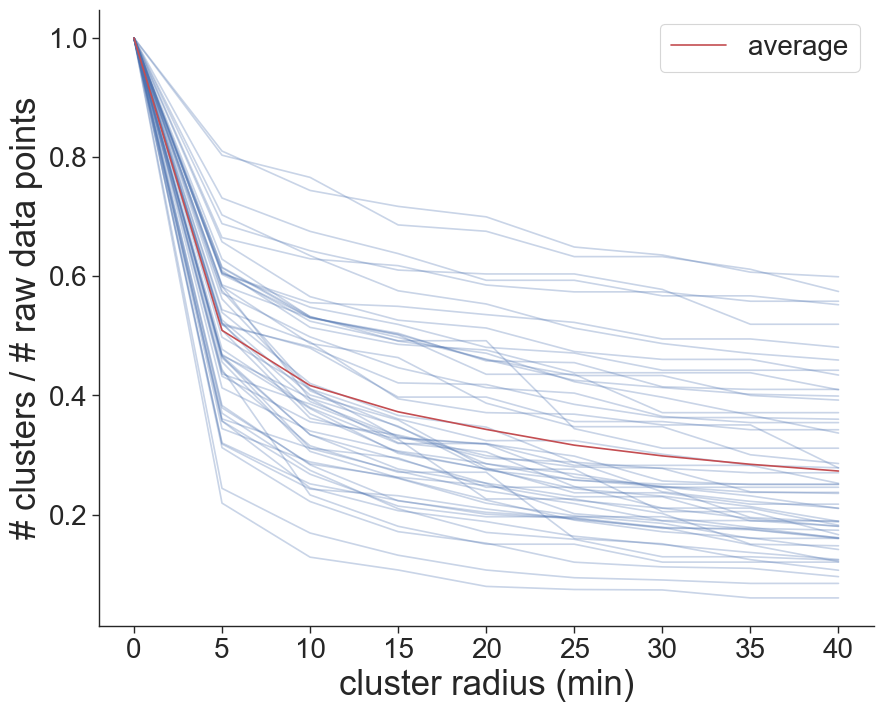

In [84]:
len_points_countries = []
for fname in os.listdir('./cluster_sensitivity'):
    r_ls = []
    points_ls = []
    with open('./cluster_sensitivity/'+fname, 'r') as file:
        csvreader = csv.reader(file)
        for line in csvreader:
            r_ls.append(int(line[0]))
            points_ls.append(float(line[1]))
    if len(points_ls) < 4:
        continue
    r_ls = np.array(r_ls)
    len_points_countries.append(np.array(points_ls)[np.argsort(r_ls)])

r_ls = sorted(r_ls)
fig, ax = plt.subplots(figsize = (10, 8))
for i in range(len(len_points_countries)):
    ax.plot(r_ls, len_points_countries[i]/len_points_countries[i][0], c = 'b', alpha = 0.3)
    
ax.plot(r_ls, np.mean(len_points_countries/np.array(len_points_countries)[:, [0]], axis = 0), 
        c = 'r', alpha = 1, label = 'average')
ax.legend(fontsize = 20)
ax.spines[['right', 'top']].set_visible(False)
ax.set_ylabel('# clusters / # raw data points', fontsize = 25)
ax.set_xlabel('cluster radius (min)', fontsize = 25)
ax.tick_params('both', labelsize = 20)
plt.savefig('./figs/cluster_sensitivity.pdf', bbox_inches='tight')
plt.show()
                             